In [24]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
import tifffile
import matplotlib.colors as mcolors
from skimage import io, measure, morphology
from scipy.ndimage import binary_dilation, generate_binary_structure
from scipy.spatial import distance
from skimage import io, color, measure
from skimage.util import img_as_float
from scipy.spatial import distance
from scipy.interpolate import interp1d
import matplotlib.colors as mcolors
import glob
import os

In [2]:
def load_images(fgf_path, fgf_mask_path, psm_mask_path, loi_path, dextran_path):
    fgf = io.imread(fgf_path)
    fgf_mask = io.imread(fgf_mask_path)
    psm_mask = io.imread(psm_mask_path)
    loi = io.imread(loi_path)
    dextran = io.imread(dextran_path)
    return fgf, fgf_mask, psm_mask, loi, dextran

def create_combined_mask(fgf_mask, psm_mask):
    return fgf_mask * psm_mask

def find_positive_pixels(fgf_psm_mask, fgf_image):
    positive_pixels = np.column_stack(np.where(fgf_psm_mask))
    intensities = fgf_image[positive_pixels[:, 0], positive_pixels[:, 1]]
    return positive_pixels, intensities

def calculate_nearest_loi_points(positive_pixels, loi_coords):
    nearest_loi_points = []
    for pixel in positive_pixels:
        distances = distance.cdist([pixel], loi_coords, metric='euclidean')
        nearest_loi_point = np.argmin(distances)
        nearest_loi_points.append(nearest_loi_point)
    return np.array(nearest_loi_points)

def calculate_intensity_profile(nearest_loi_points, intensities, loi_coords):
    intensity_profile = np.zeros(len(loi_coords))
    counts = np.zeros(len(loi_coords))
    for i, loi_point_index in enumerate(nearest_loi_points):
        intensity_profile[loi_point_index] += intensities[i]
        counts[loi_point_index] += 1
    intensity_profile = np.divide(intensity_profile, counts, out=np.zeros_like(intensity_profile), where=counts > 0)
    return intensity_profile

def plot_intensity_profile(positions, interpolated_intensities, save_path):
    plt.figure(figsize=(10, 5))
    plt.plot(positions, interpolated_intensities, c='b')
    plt.xlabel('Position along the PSM (a.u.)')
    plt.ylabel('Normalized FGF Intensity (a.u.)')
    plt.savefig(save_path, format='svg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

def visualize_filtered_fgf(fgf_image, fgf_psm_binary, save_path):
    filtered_fgf = np.zeros_like(fgf_image)
    filtered_fgf[fgf_psm_binary] = fgf_image[fgf_psm_binary]
    
    plt.figure(figsize=(10, 5))
    plt.imshow(filtered_fgf, cmap='turbo', vmin=0, vmax=5500)
    plt.colorbar(label='FGF Intensity (Non Normalized)')
    plt.axis('off')
    plt.savefig(save_path, format='svg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

def visualize_filtered_normalized_fgf(fgf_image, dextran_image, fgf_psm_binary, save_path):
    normalized_fgf = np.zeros_like(fgf_image, dtype=np.float64)
    non_zero_dextran = dextran_image[fgf_psm_binary] > 0
    normalized_fgf[fgf_psm_binary] = fgf_image[fgf_psm_binary].astype(np.float64) / np.where(dextran_image[fgf_psm_binary] > 0, dextran_image[fgf_psm_binary], 1)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(normalized_fgf, cmap='turbo')
    plt.colorbar(label='FGF Intensity (Normalized)')
    plt.axis('off')
    plt.savefig(save_path, format='svg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

def plot_combined_binned_profiles(all_interp_positions, all_interp_values, save_path, num_timepoints):
    fig, ax = plt.subplots(figsize=(10, 5))

    cmap = plt.get_cmap('plasma')  
    norm = plt.Normalize(vmin=0, vmax=num_timepoints - 1) 

    for i, (interp_positions, interp_values) in enumerate(zip(all_interp_positions, all_interp_values)):
        color = cmap(norm(i))  
        ax.plot(interp_positions, interp_values, color=color)  

    ax.set_xlabel('Binned Position along the PSM (a.u.)')
    ax.set_ylabel('Normalized FGF Intensity (a.u.)')

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', pad=0.05)  
    cbar.set_label('Time') 
    cbar_ticks = np.linspace(0, num_timepoints - 1, 5).astype(int)  
    cbar.set_ticks(cbar_ticks)
    cbar.set_ticklabels([f"{i * 15} min" for i in cbar_ticks])  
    plt.savefig(save_path, format='svg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

def load_multiple_images(image_dir, mask_dir, psm_dir, loi_dir, dextran_dir):
    fgf_images = sorted(glob.glob(os.path.join(image_dir, '*.tif')))
    fgf_masks = sorted(glob.glob(os.path.join(mask_dir, '*.tif')))
    psm_masks = sorted(glob.glob(os.path.join(psm_dir, '*.tif')))
    lois = sorted(glob.glob(os.path.join(loi_dir, '*.tif')))
    dextran_images = sorted(glob.glob(os.path.join(dextran_dir, '*.tif')))
    
    if not (len(fgf_images) == len(fgf_masks) == len(psm_masks) == len(lois) == len(dextran_images)):
        raise ValueError("Not the same number of images")
    
    return fgf_images, fgf_masks, psm_masks, lois, dextran_images

In [3]:
def fgf_quantification_pipeline_multiple(image_dir, mask_dir, psm_dir, loi_dir, dextran_dir, results_dir):
    fgf_images, fgf_masks, psm_masks, lois, dextran_images = load_multiple_images(image_dir, mask_dir, psm_dir, loi_dir, dextran_dir)
    
    all_interp_positions = []
    all_interp_values = []

    for i, (fgf_path, fgf_mask_path, psm_mask_path, loi_path, dextran_path) in enumerate(zip(fgf_images, fgf_masks, psm_masks, lois, dextran_images)):
        print(f"Processing image set {i + 1}/{len(fgf_images)}")
        
        image_results_dir = os.path.join(results_dir, f"image_set_{i + 1}")
        os.makedirs(image_results_dir, exist_ok=True)

        interp_positions, interp_values = fgf_quantification_pipeline_with_euclidean(fgf_path, fgf_mask_path, psm_mask_path, loi_path, dextran_path, image_results_dir)

        all_interp_positions.append(interp_positions)
        all_interp_values.append(interp_values)

    combined_plot_path = os.path.join(results_dir, 'combined_binned_profiles.svg')
    plot_combined_binned_profiles(all_interp_positions, all_interp_values, combined_plot_path, num_timepoints=len(fgf_images))
    
    
    print(f"Processing complete. Results saved in {results_dir}")

def fgf_quantification_pipeline_with_euclidean(fgf_path, fgf_mask_path, psm_mask_path, loi_path, dextran_path, results_dir):
    fgf, fgf_mask, psm_mask, loi, dextran = load_images(fgf_path, fgf_mask_path, psm_mask_path, loi_path, dextran_path)
    fgf_psm_mask = create_combined_mask(fgf_mask, psm_mask)
    positive_pixels, fgf_intensities = find_positive_pixels(fgf_psm_mask, fgf)

    dextran_positive_pixels, dextran_intensities = find_positive_pixels(fgf_psm_mask, dextran)

    normalized_intensities = np.divide(fgf_intensities.astype(np.float64), dextran_intensities.astype(np.float64),
                                       out=np.zeros_like(fgf_intensities, dtype=np.float64), where=dextran_intensities > 0)

    loi_coords = np.column_stack(np.where(loi))
    nearest_loi_points = calculate_nearest_loi_points(positive_pixels, loi_coords)
    intensity_profile = calculate_intensity_profile(nearest_loi_points, normalized_intensities, loi_coords)

    rightmost_loi_point = loi_coords[np.argmax(loi_coords[:, 1])]
    distances_from_rightmost = distance.cdist([rightmost_loi_point], loi_coords, metric='euclidean').flatten()

    sorted_indices = np.argsort(distances_from_rightmost)
    sorted_distances = distances_from_rightmost[sorted_indices]
    sorted_intensity_profile = intensity_profile[sorted_indices]

    non_zero_mask = sorted_intensity_profile > 0
    interp_func = interp1d(sorted_distances[non_zero_mask], sorted_intensity_profile[non_zero_mask], bounds_error=False, fill_value="extrapolate")
    interpolated_intensities = interp_func(sorted_distances)

    plt.figure(figsize=(10, 5))
    plt.plot(sorted_distances, interpolated_intensities, c='b')
    plt.xlabel('Position along the PSM (a.u.)')
    plt.ylabel('Normalized FGF Intensity (a.u.)')
    plot_path = os.path.join(results_dir, 'intensity_profile_euclidean.svg')
    plt.savefig(plot_path, format='svg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    filtered_fgf_image_path = os.path.join(results_dir, 'filtered_fgf_image_non_normalized.svg')
    fgf_psm_binary = fgf_psm_mask > 0
    visualize_filtered_fgf(fgf, fgf_psm_binary, filtered_fgf_image_path)

    filtered_fgf_image_normalized_path = os.path.join(results_dir, 'filtered_fgf_image_normalized.svg')
    visualize_filtered_normalized_fgf(fgf, dextran, fgf_psm_binary, filtered_fgf_image_normalized_path)

    num_bins = 50
    bin_edges = np.linspace(0, sorted_distances[-1], num_bins + 1)
    bin_indices = np.digitize(sorted_distances, bin_edges)

    binned_intensities = np.array([interpolated_intensities[bin_indices == i].mean() for i in range(1, num_bins + 1)])
    bin_centers = [(bin_edges[i] + bin_edges[i + 1]) / 2 for i in range(num_bins)]

    interp_bin_func = interp1d(bin_centers, binned_intensities, kind='linear', fill_value="extrapolate")
    interp_positions = np.linspace(bin_centers[0], bin_centers[-1], 1000)
    interp_values = interp_bin_func(interp_positions)

    plt.figure(figsize=(10, 5))
    plt.plot(interp_positions, interp_values, c='b')
    plt.xlabel('Binned Position along the PSM (a.u.)')
    plt.ylabel('Normalized FGF Intensity (a.u.)')
    binned_plot_path = os.path.join(results_dir, 'binned_plot_euclidean.svg')
    plt.savefig(binned_plot_path, format='svg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    return interp_positions, interp_values

Processing image set 1/22


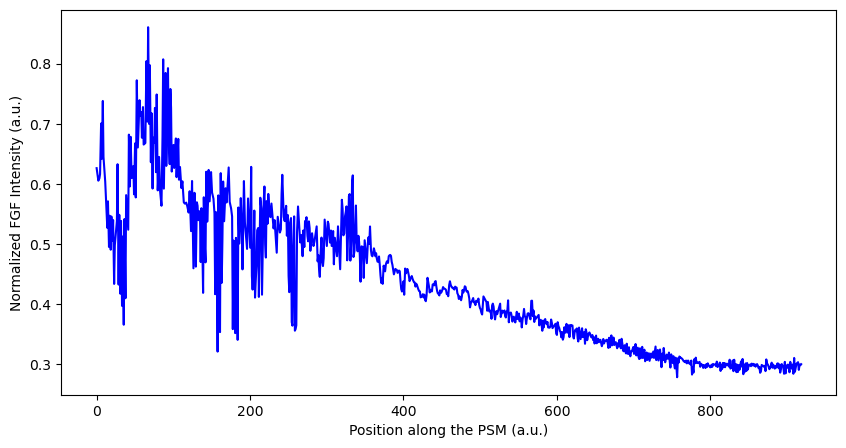

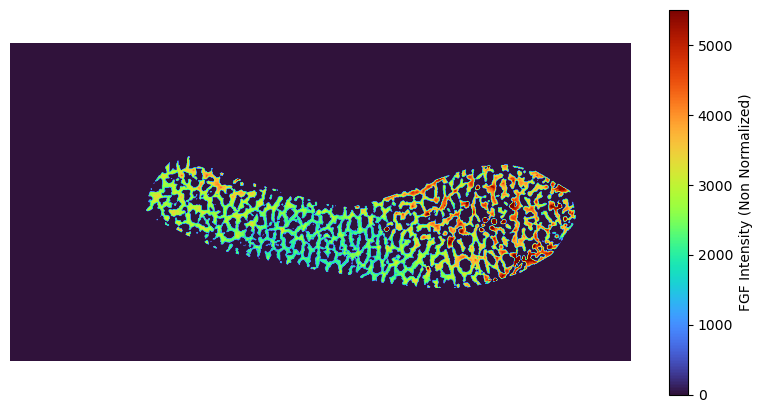

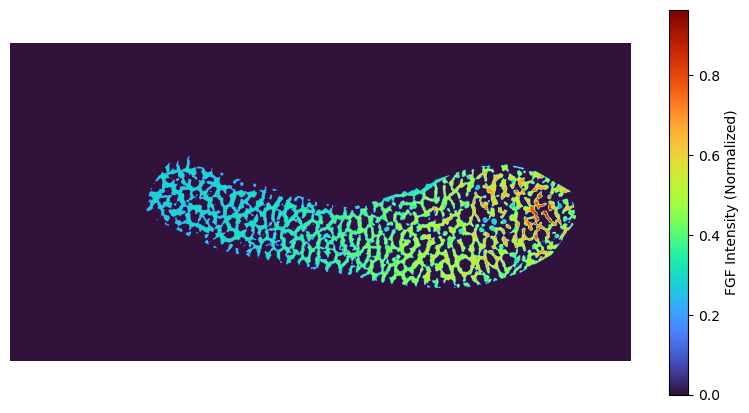

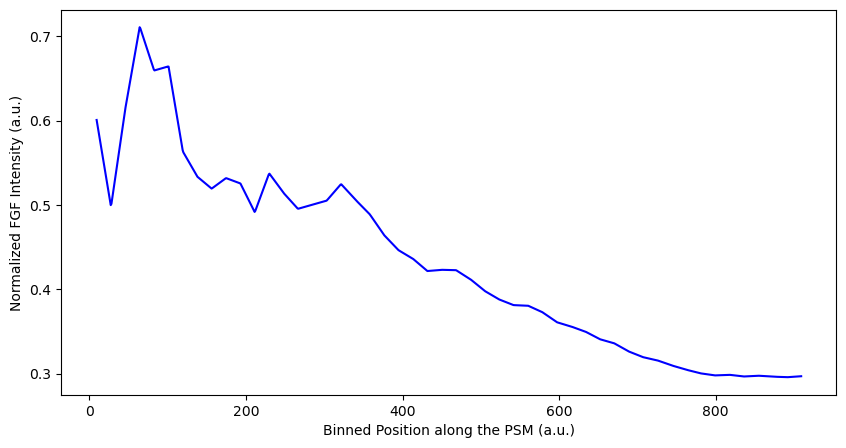

Processing image set 2/22


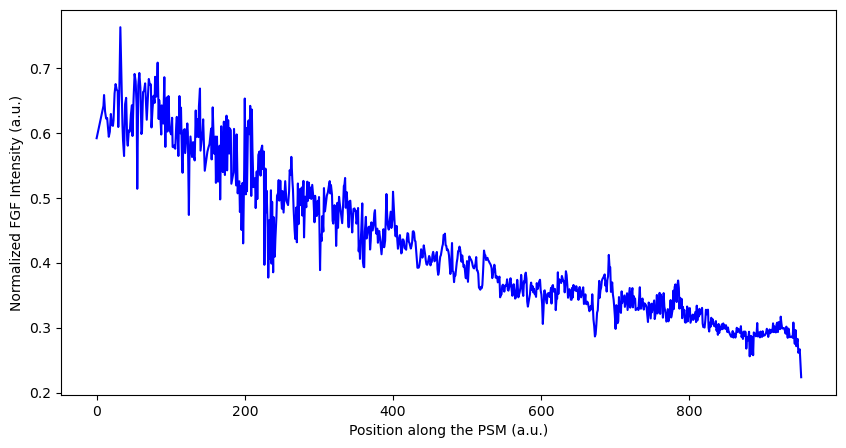

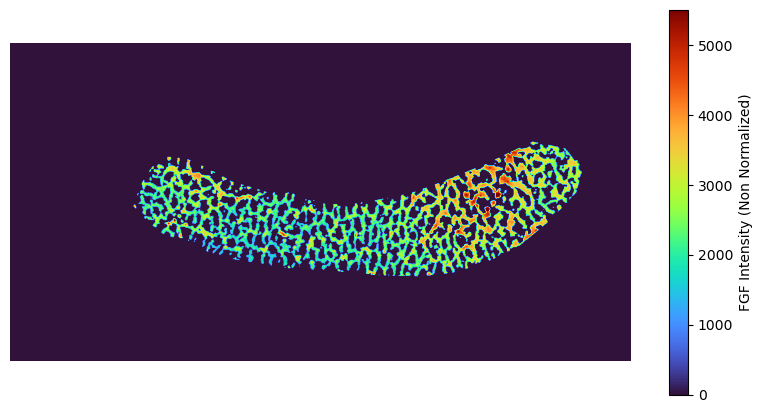

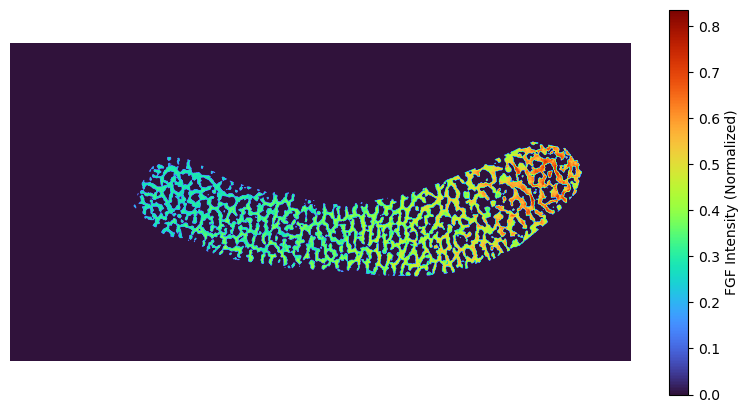

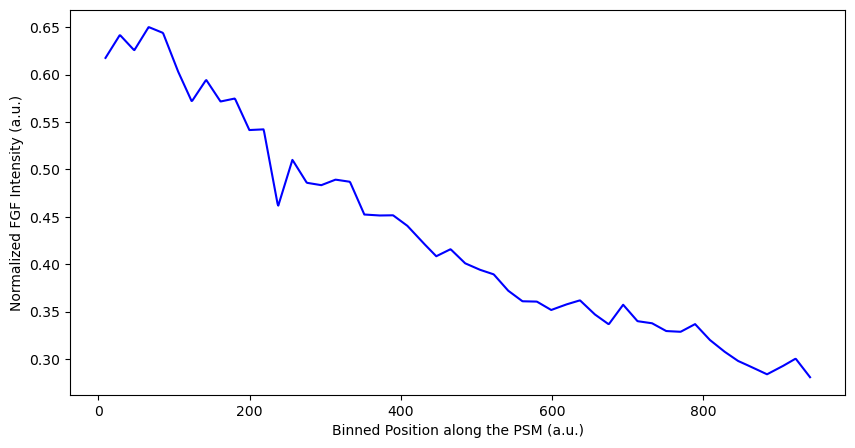

Processing image set 3/22


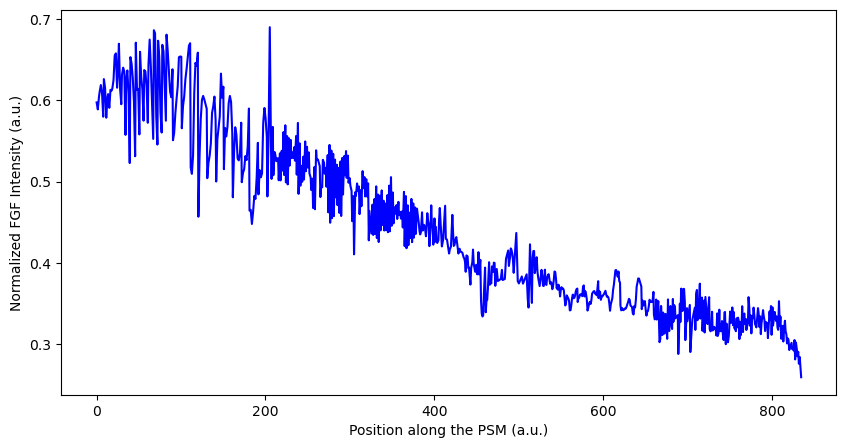

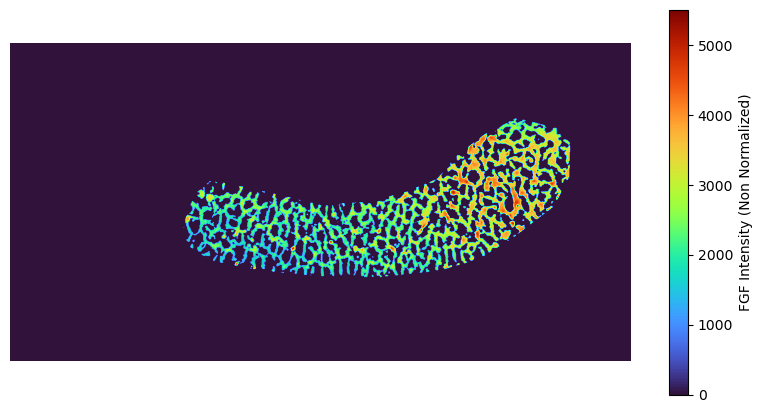

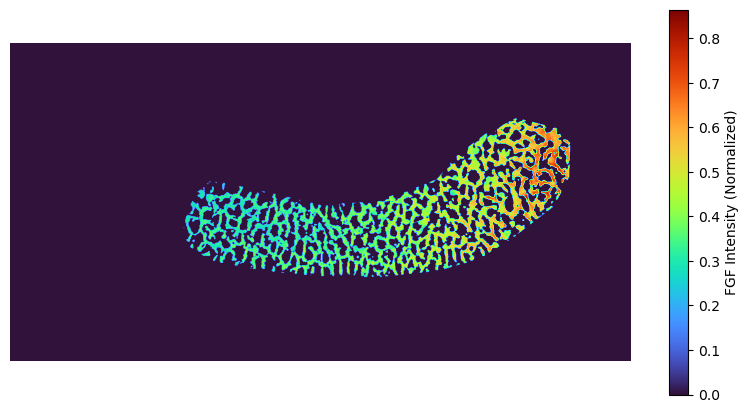

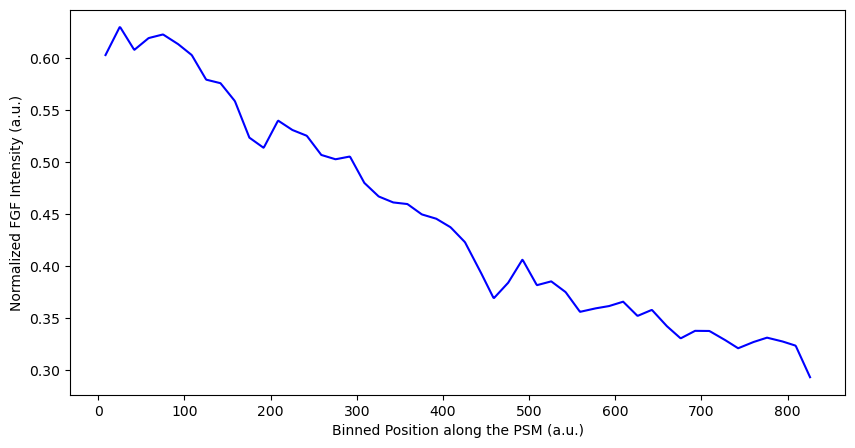

Processing image set 4/22


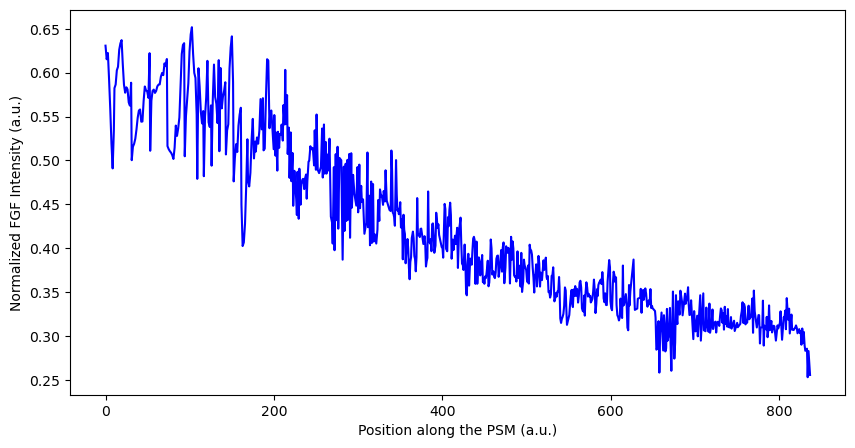

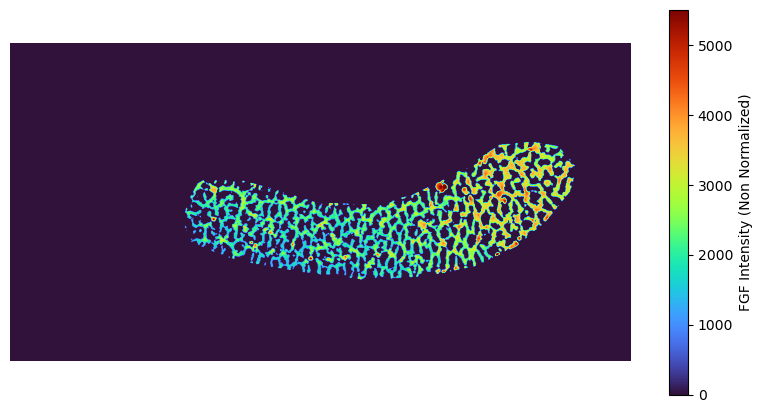

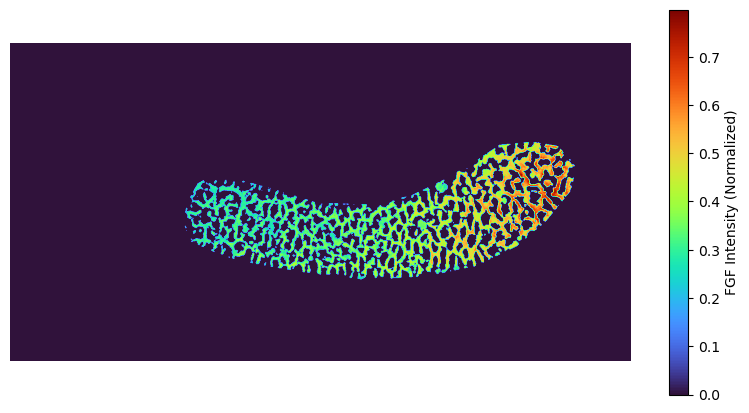

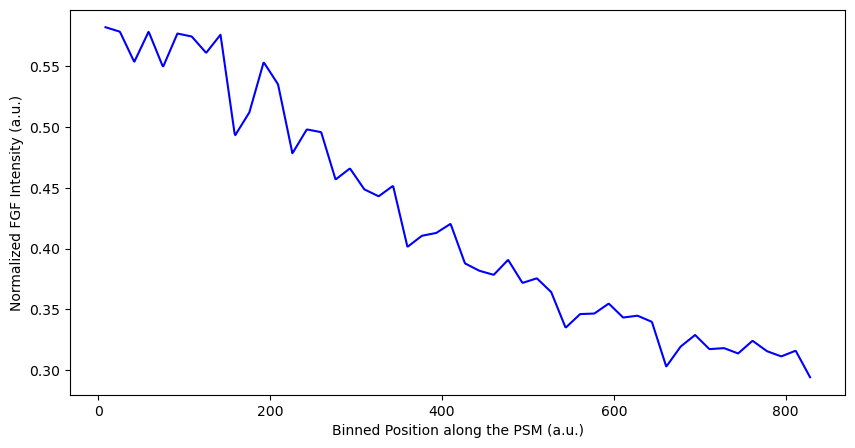

Processing image set 5/22


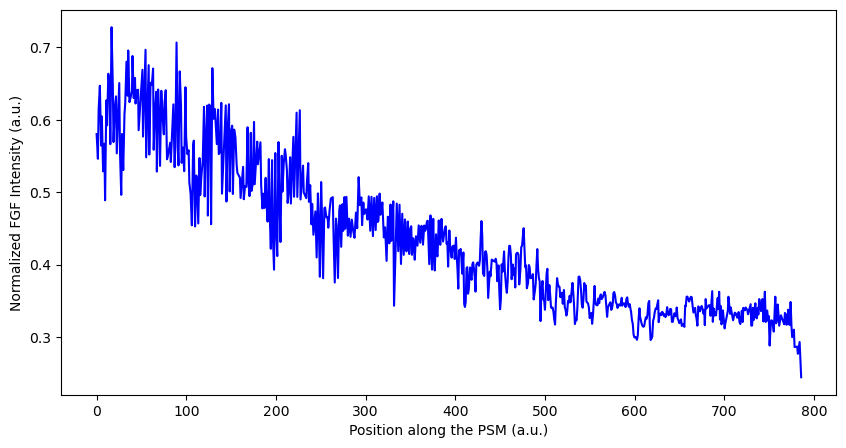

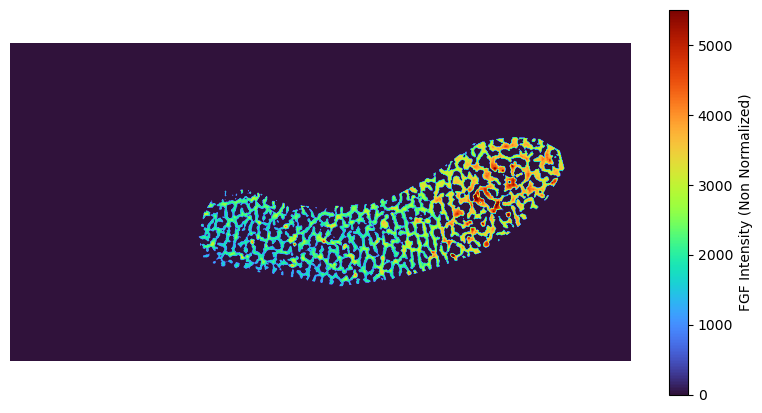

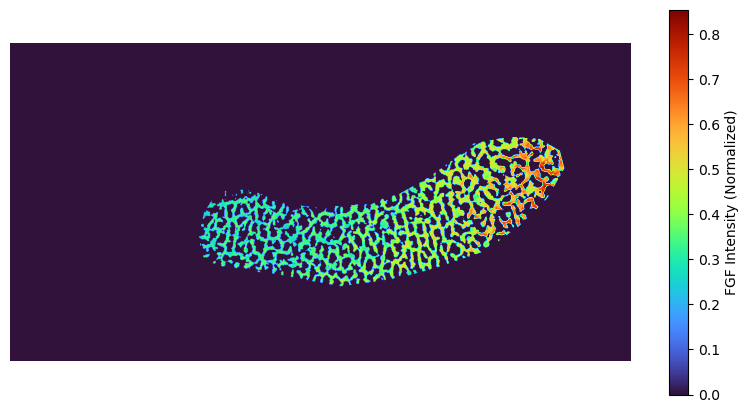

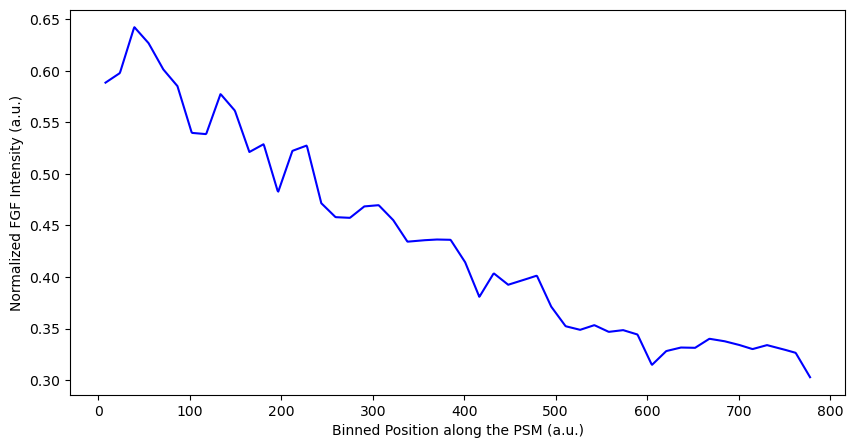

Processing image set 6/22


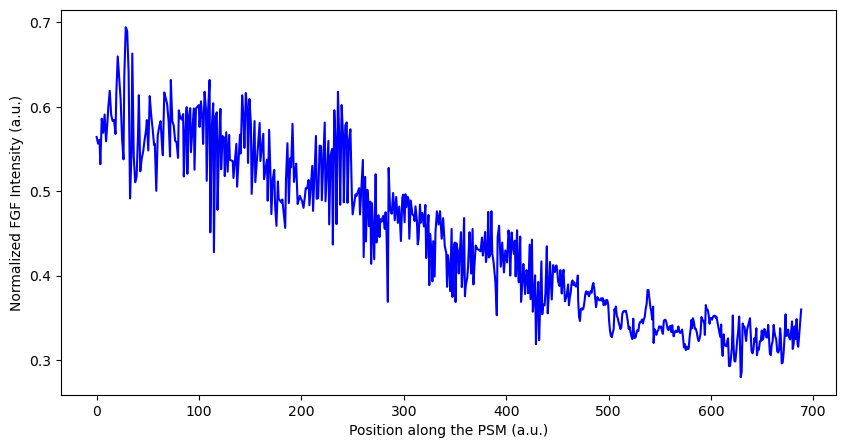

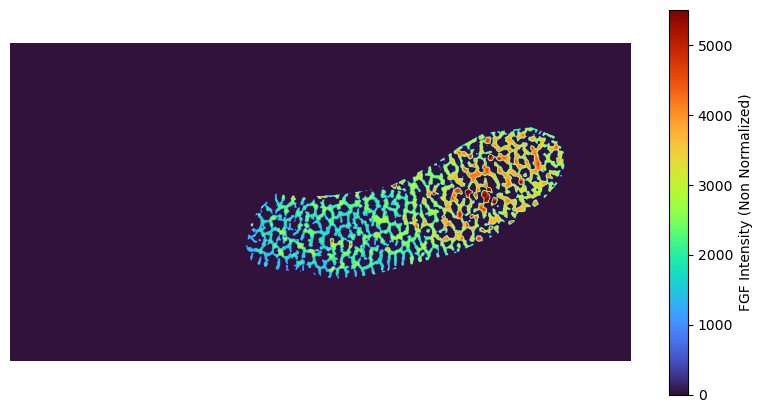

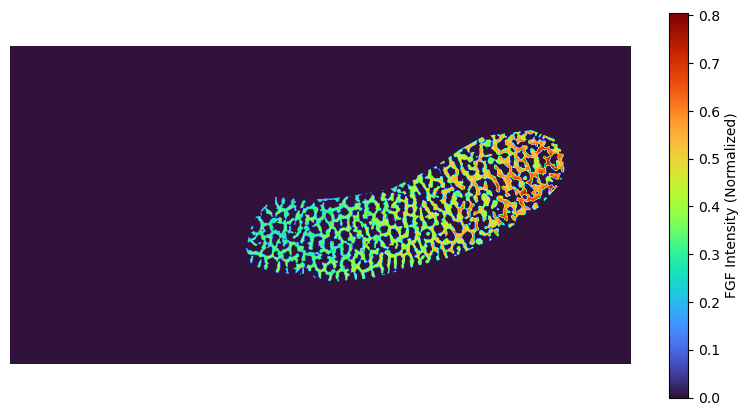

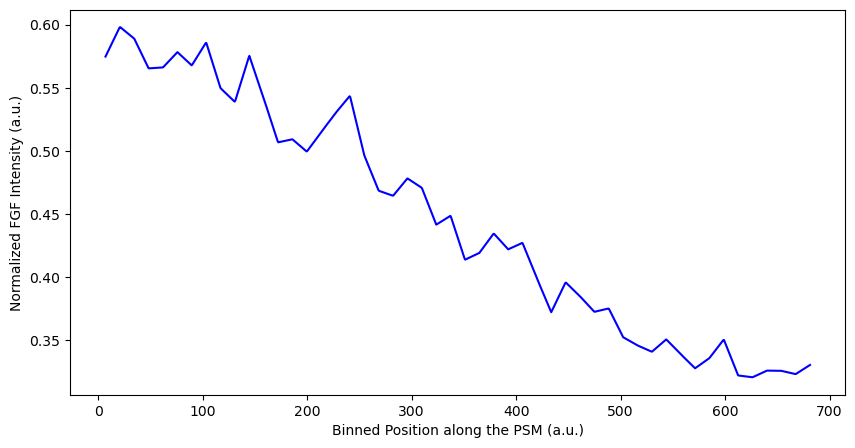

Processing image set 7/22


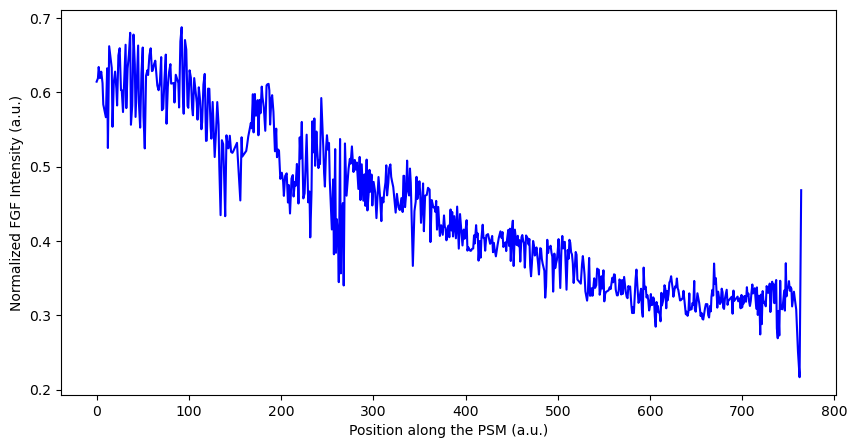

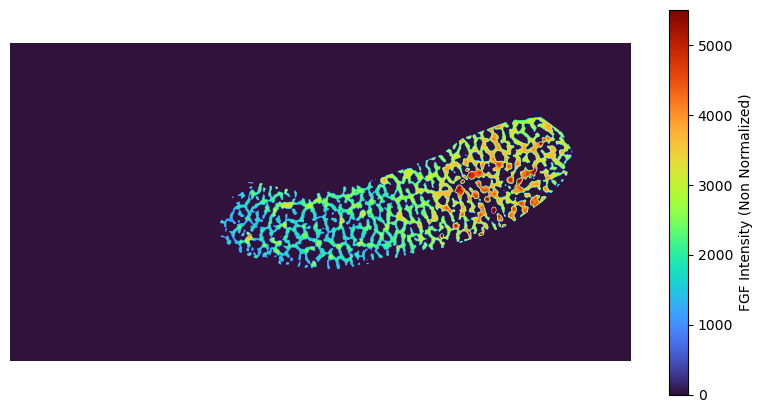

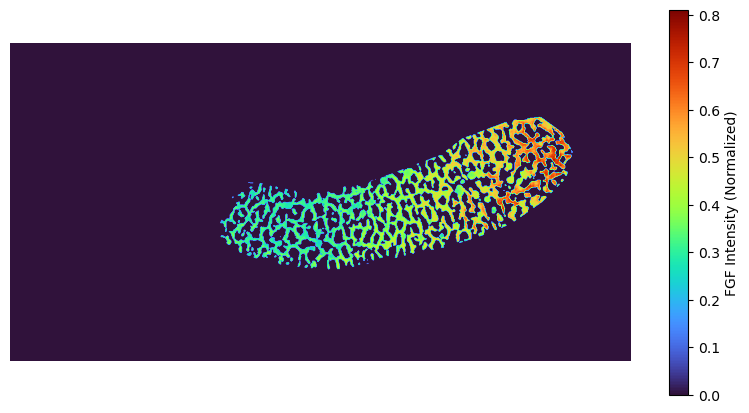

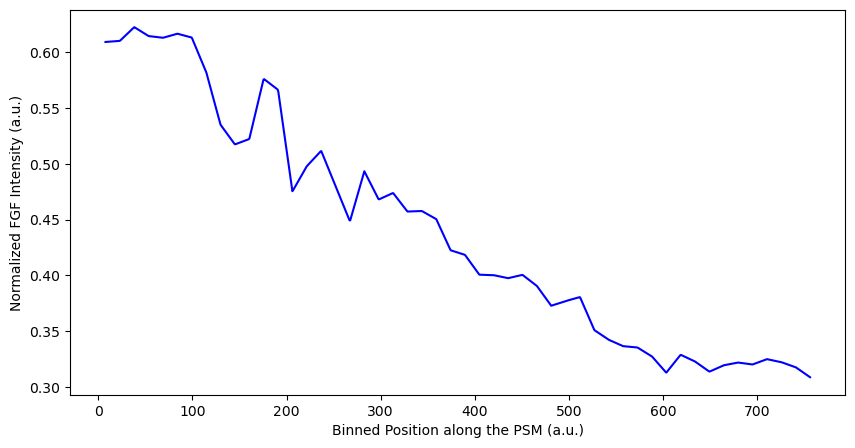

Processing image set 8/22


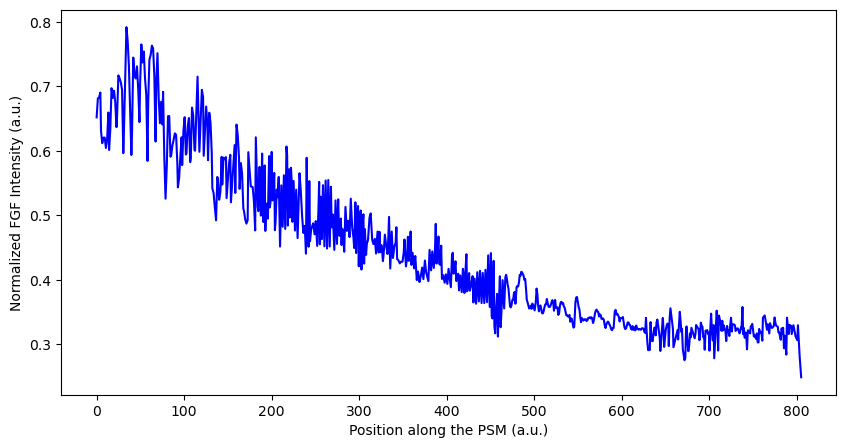

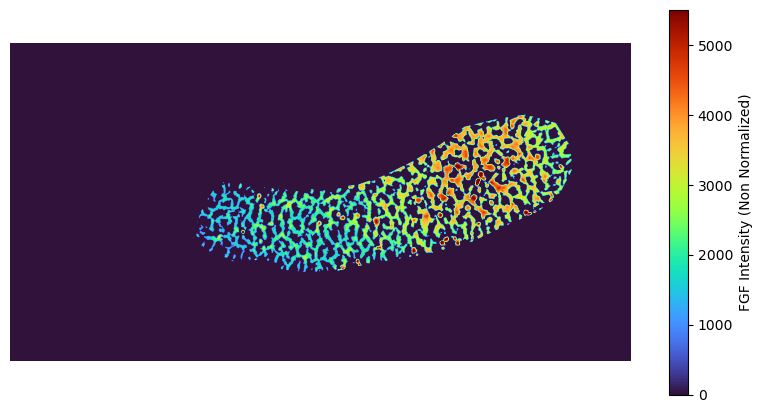

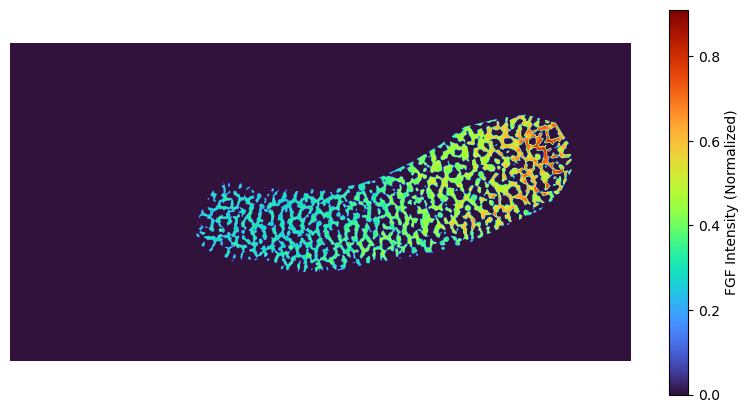

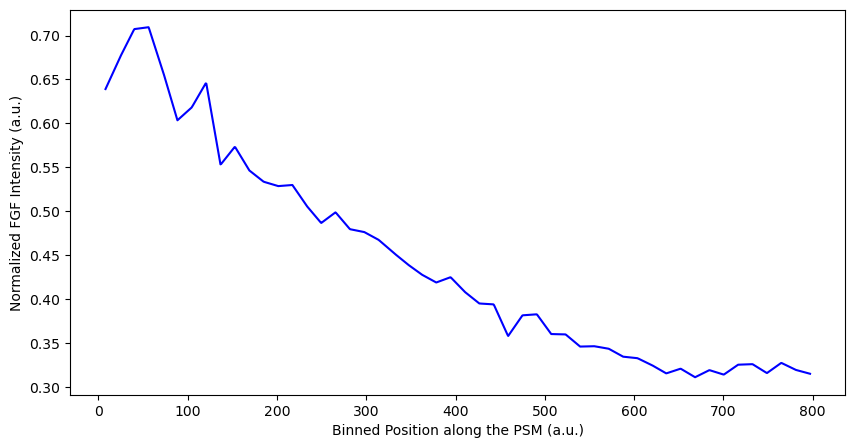

Processing image set 9/22


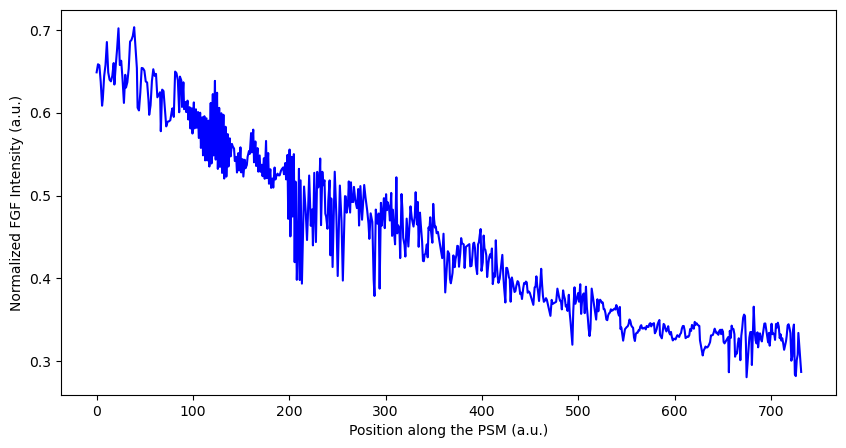

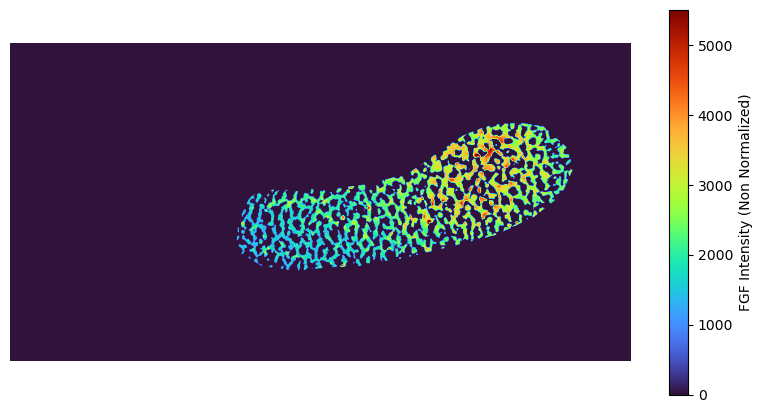

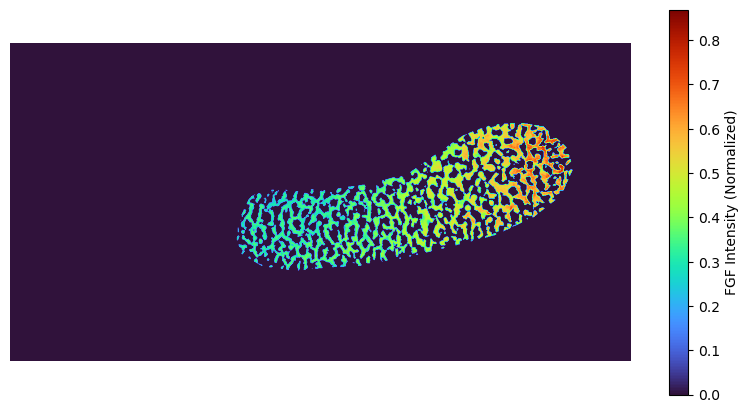

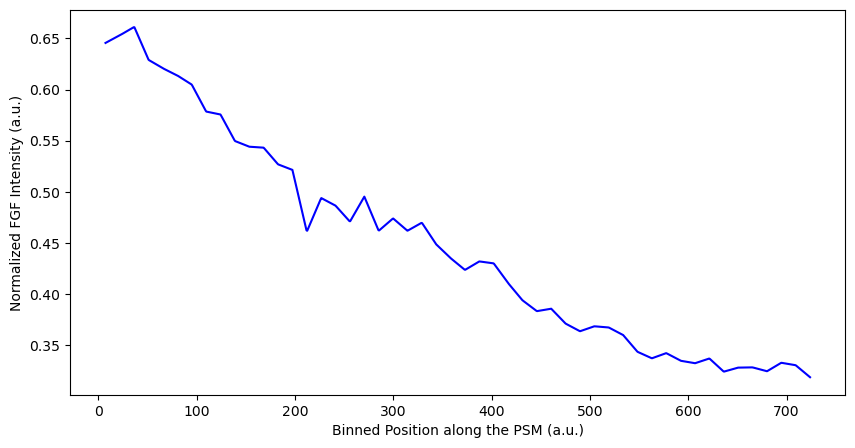

Processing image set 10/22


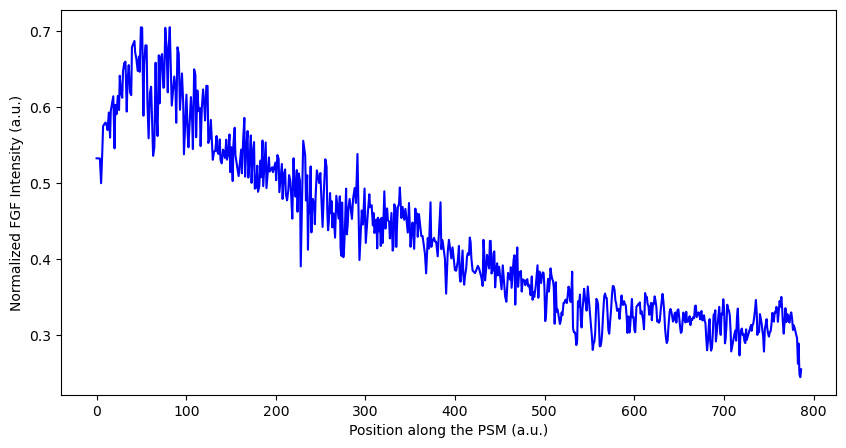

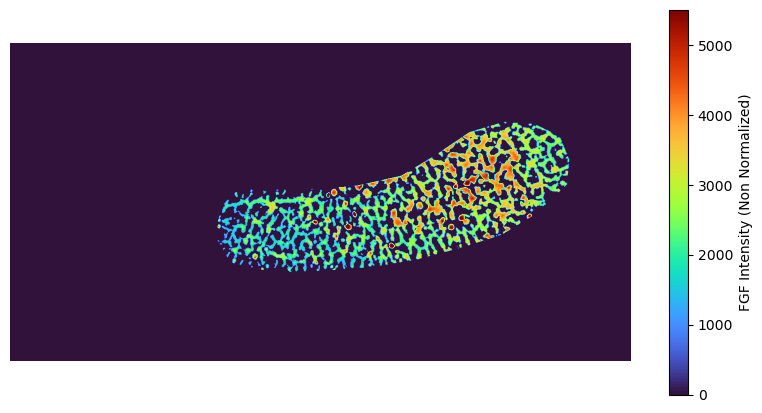

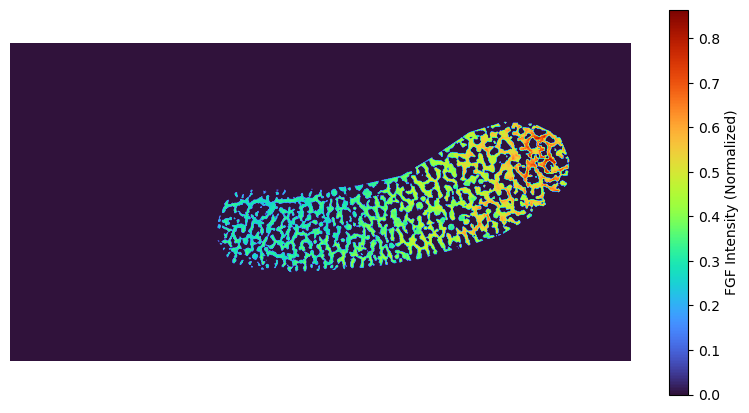

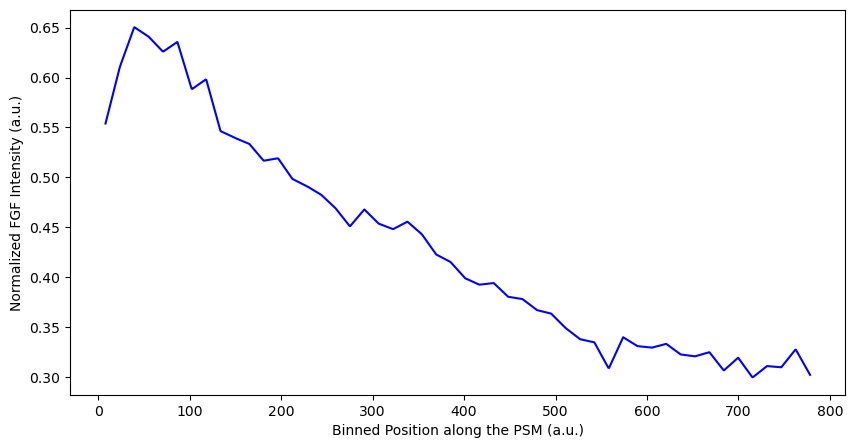

Processing image set 11/22


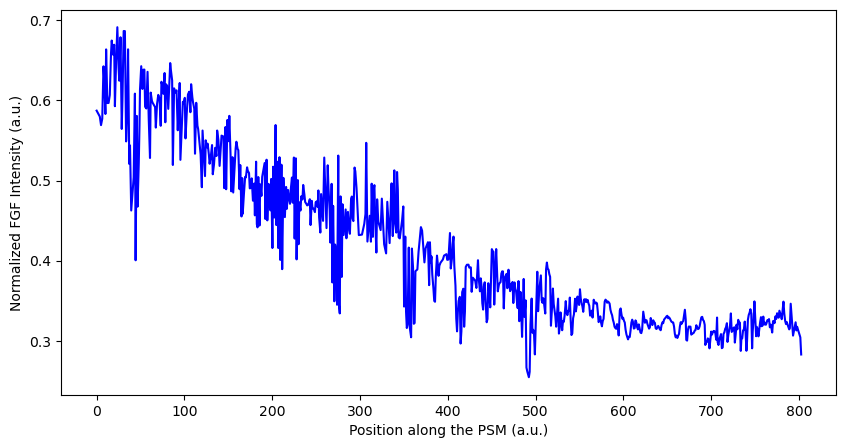

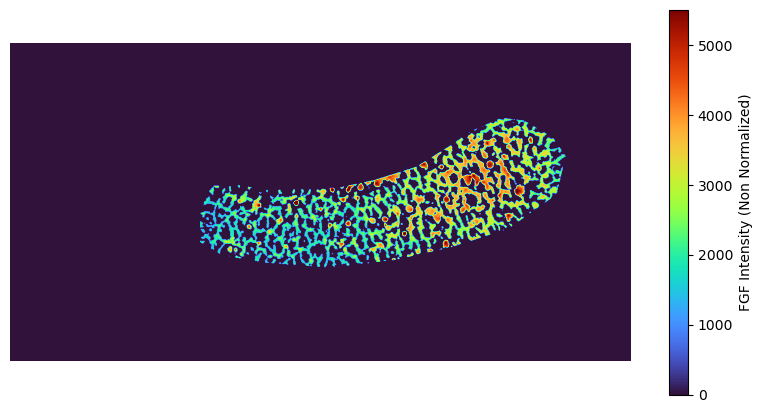

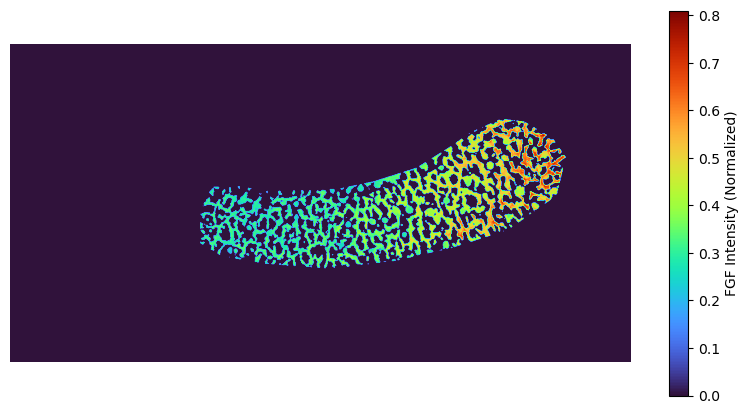

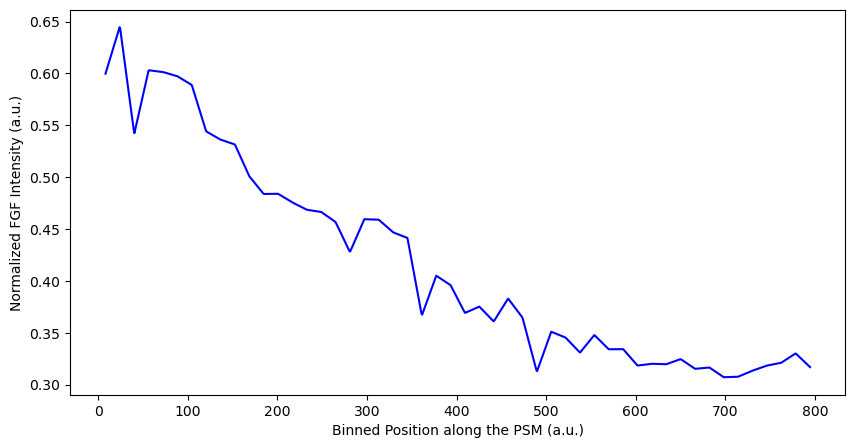

Processing image set 12/22


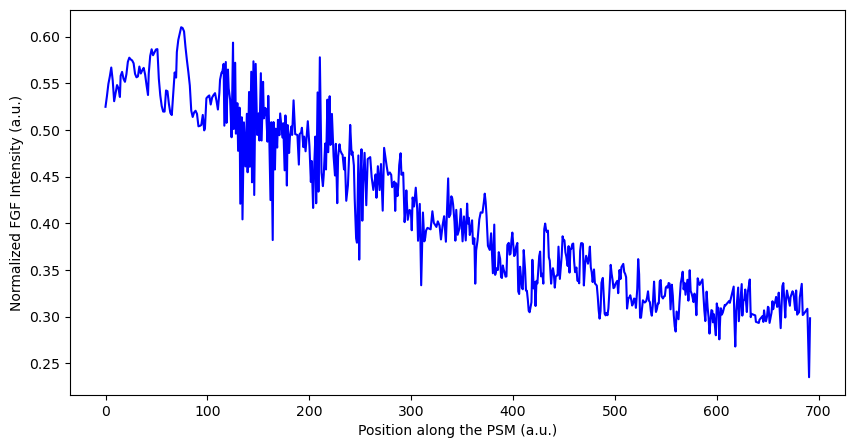

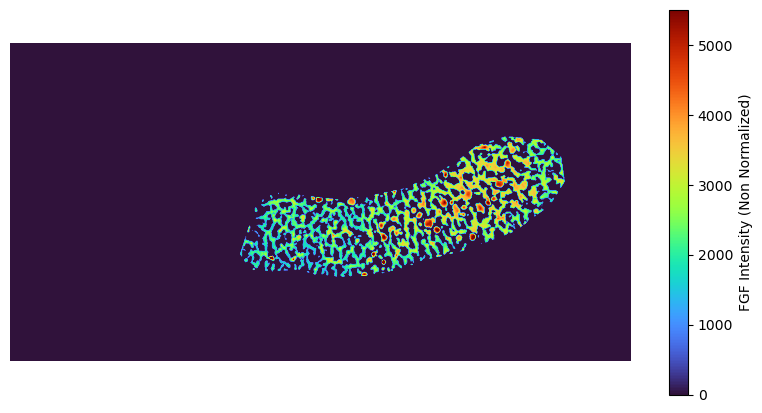

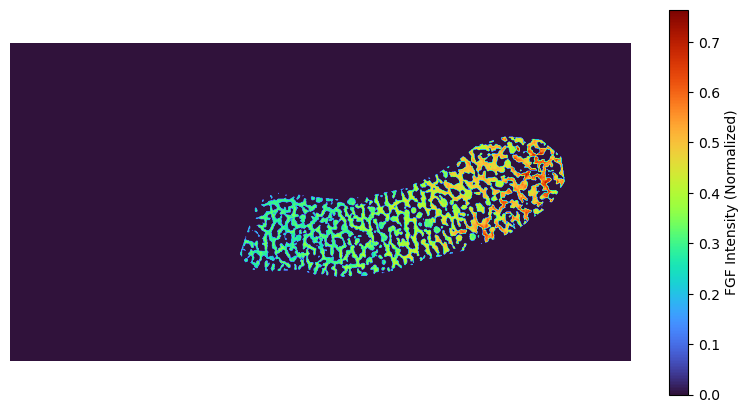

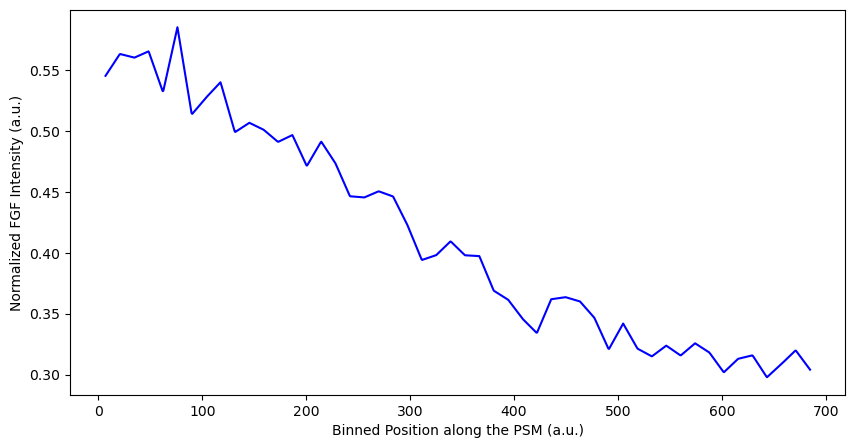

Processing image set 13/22


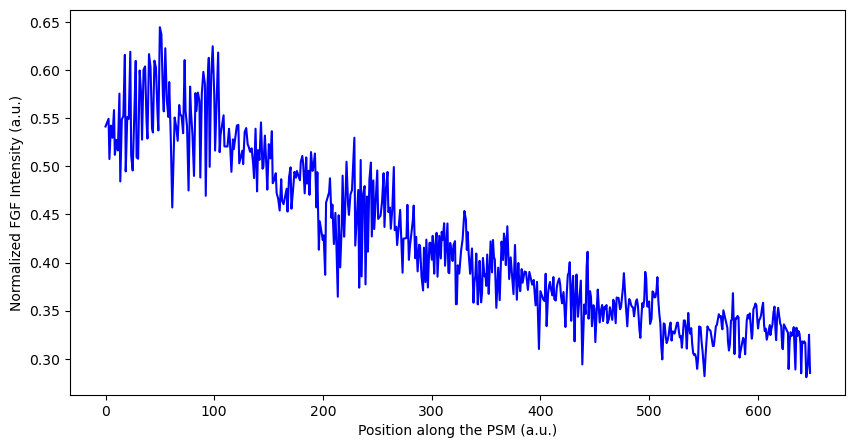

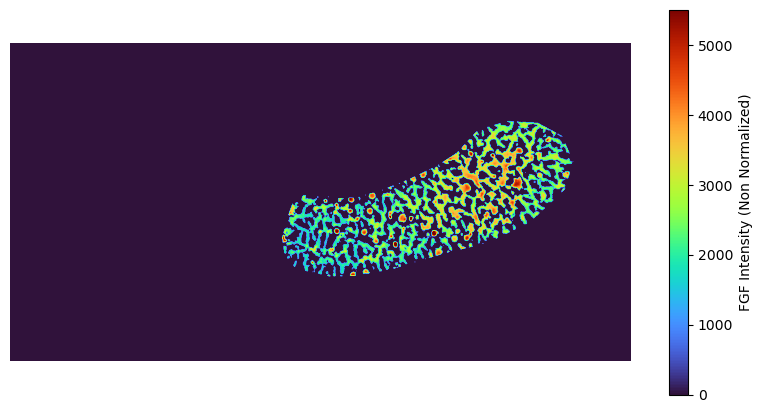

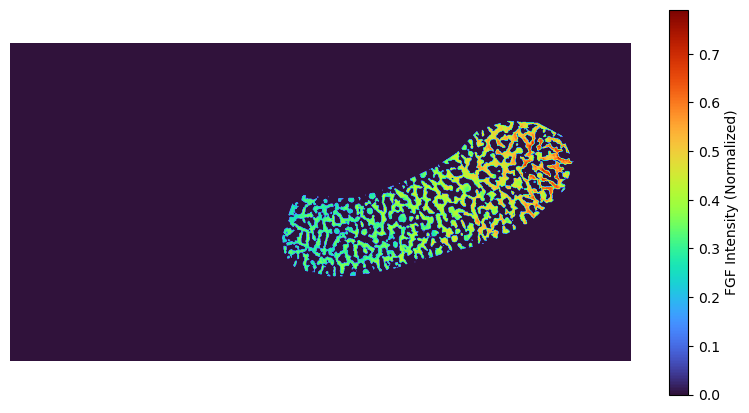

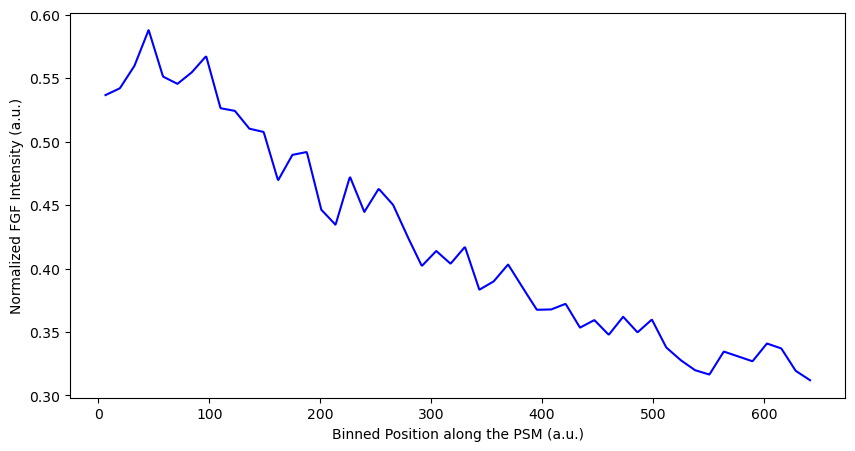

Processing image set 14/22


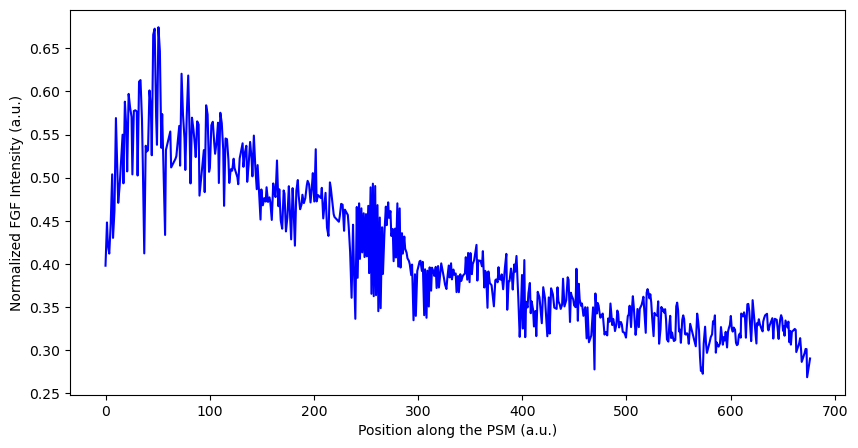

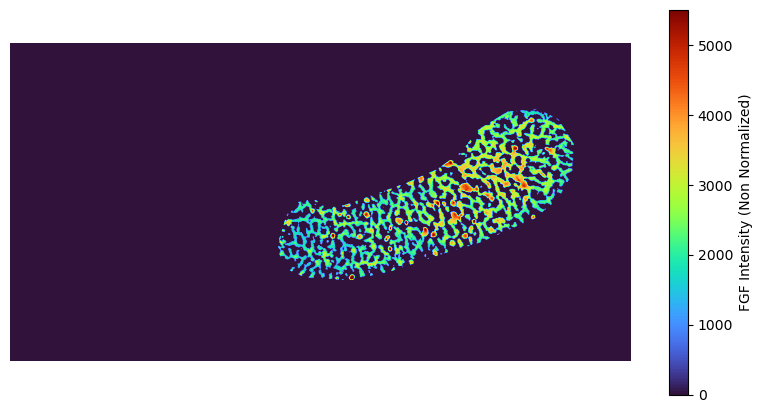

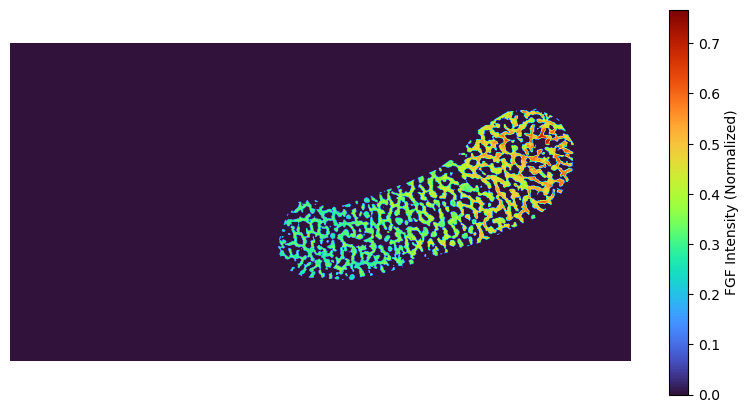

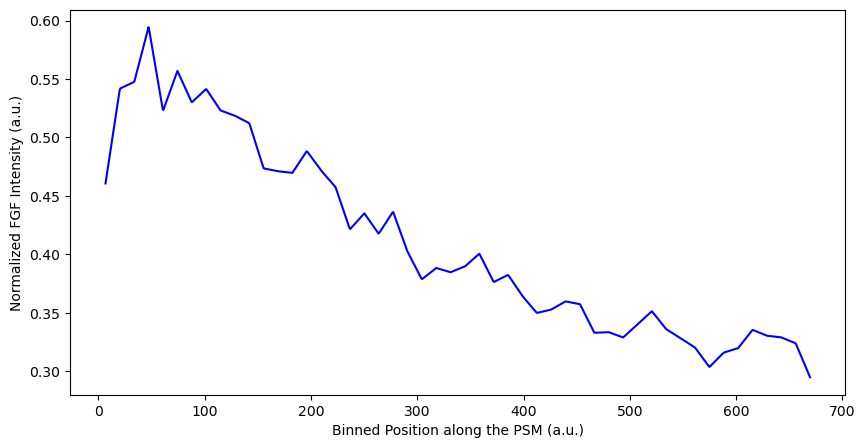

Processing image set 15/22


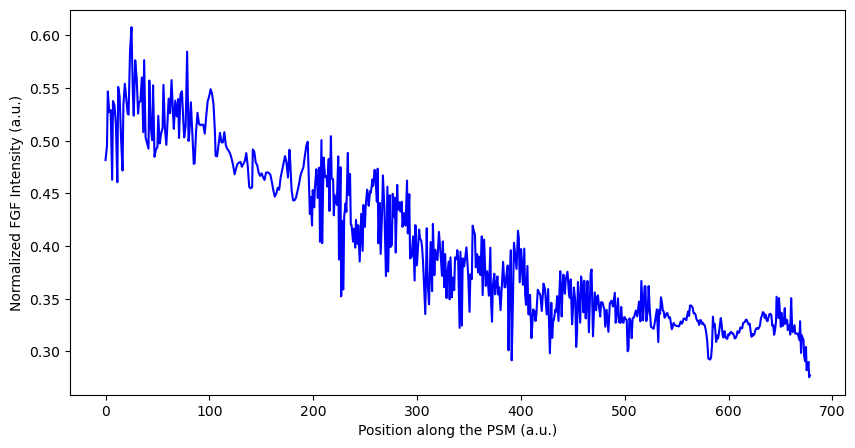

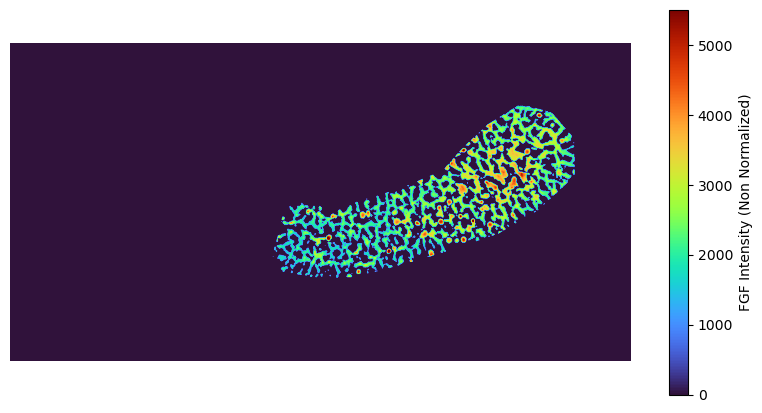

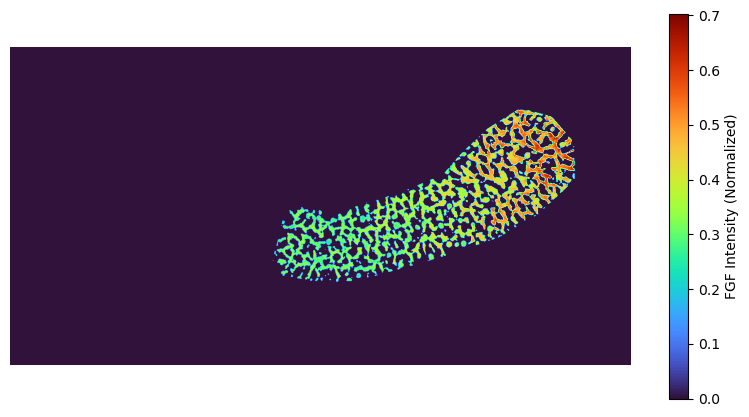

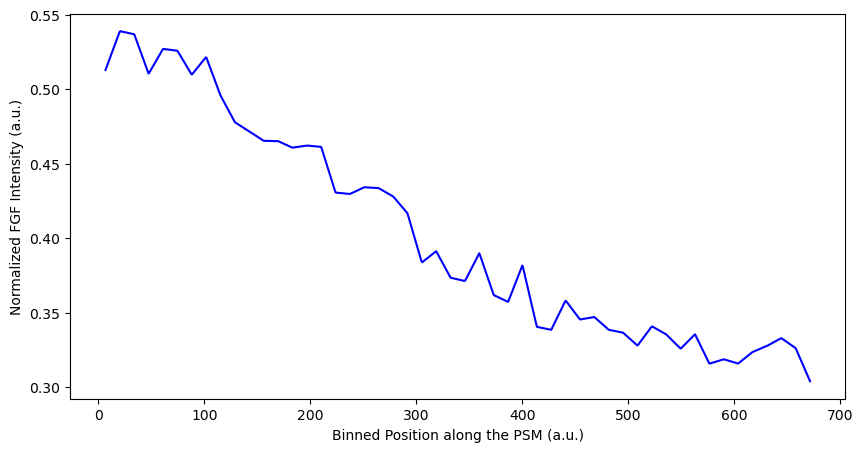

Processing image set 16/22


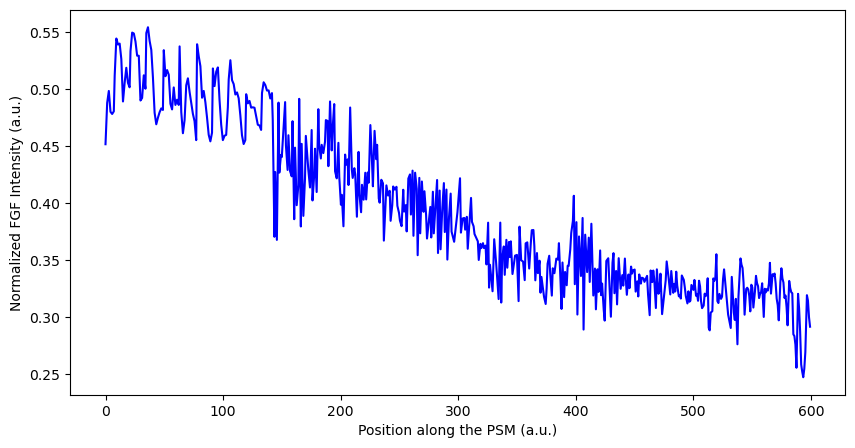

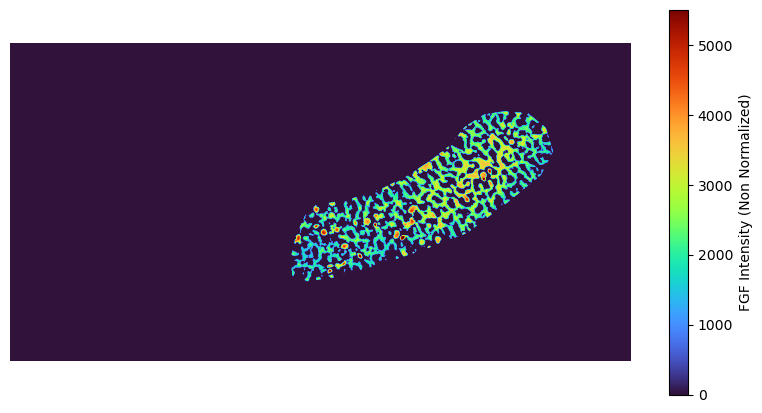

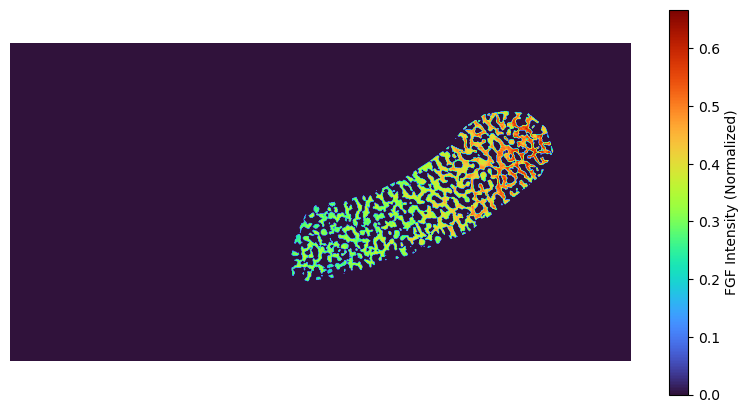

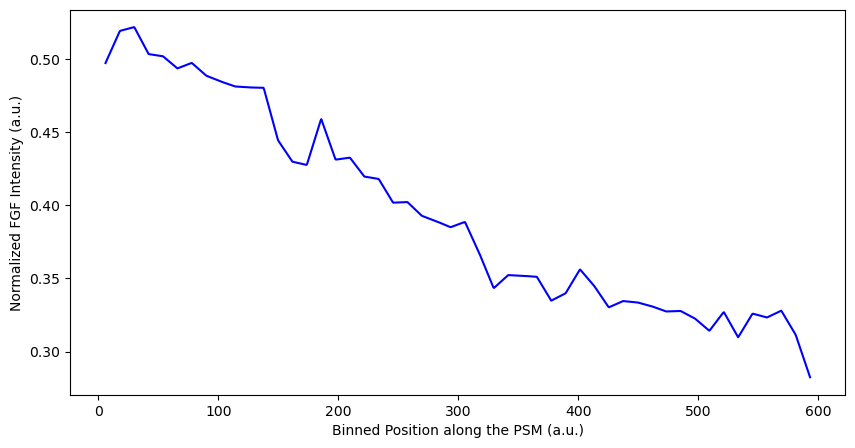

Processing image set 17/22


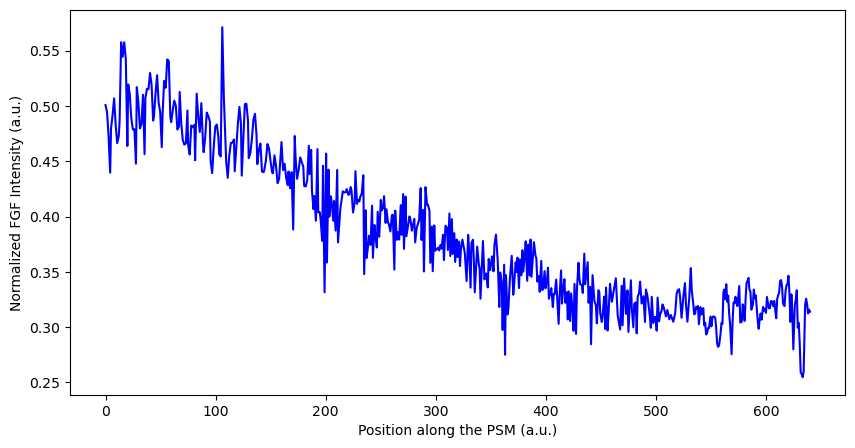

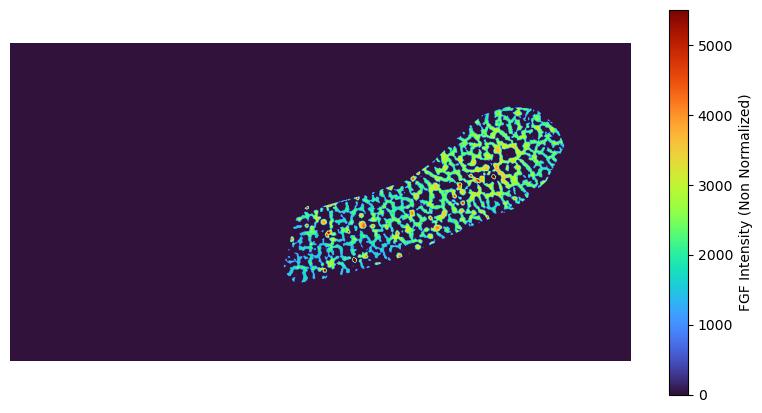

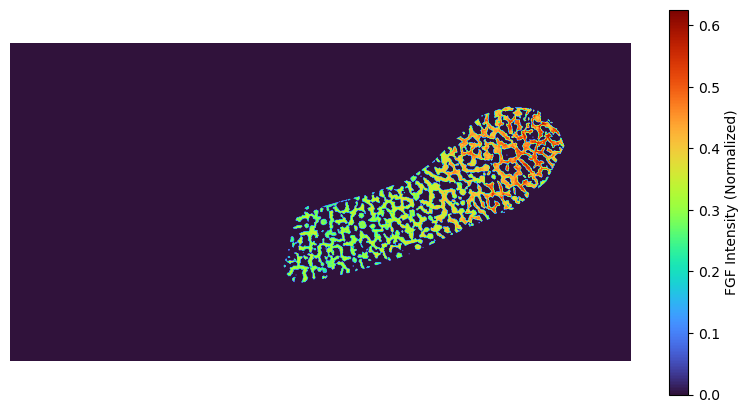

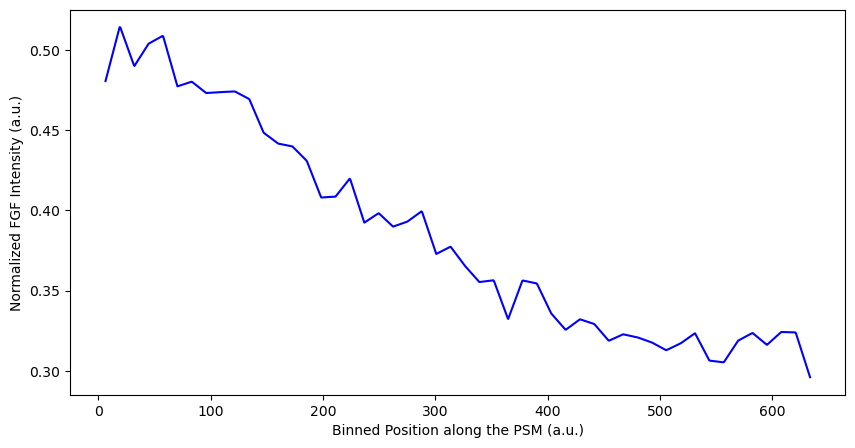

Processing image set 18/22


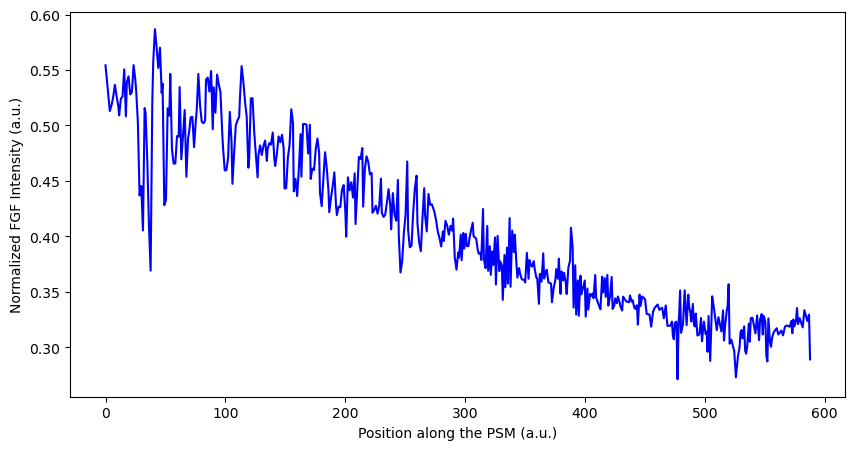

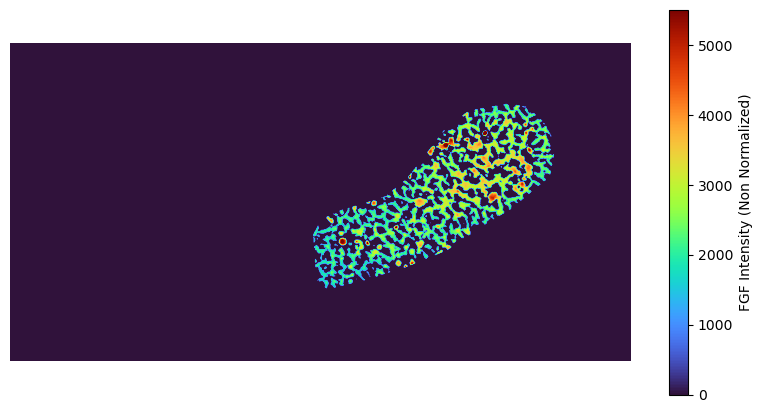

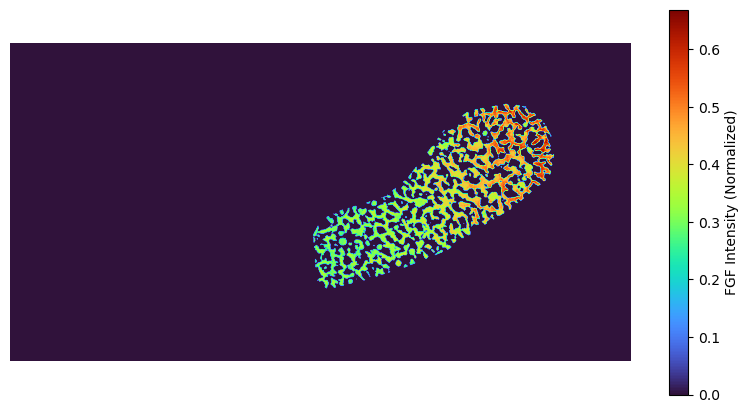

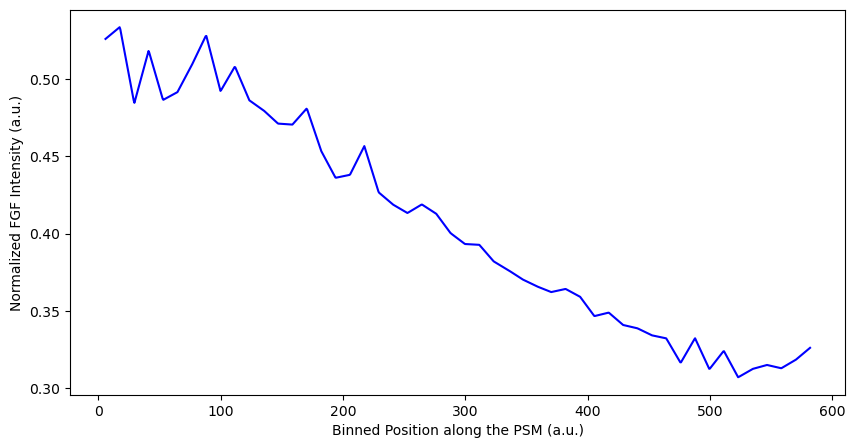

Processing image set 19/22


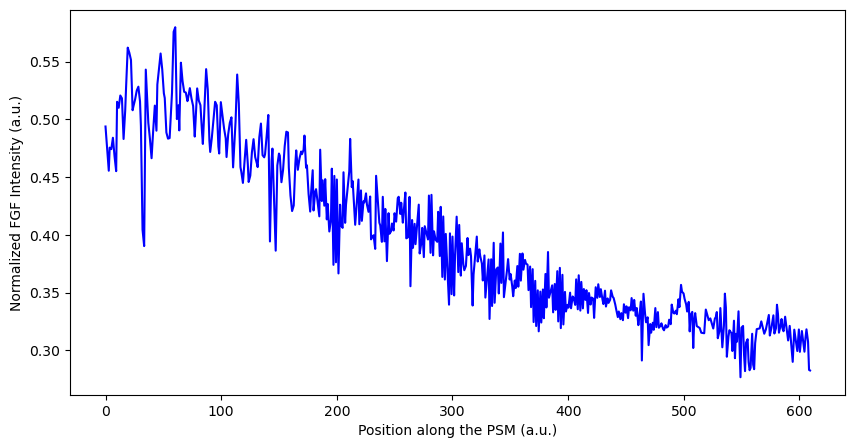

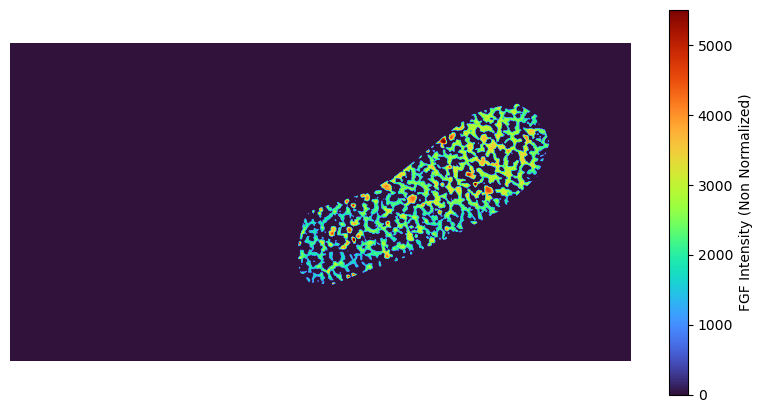

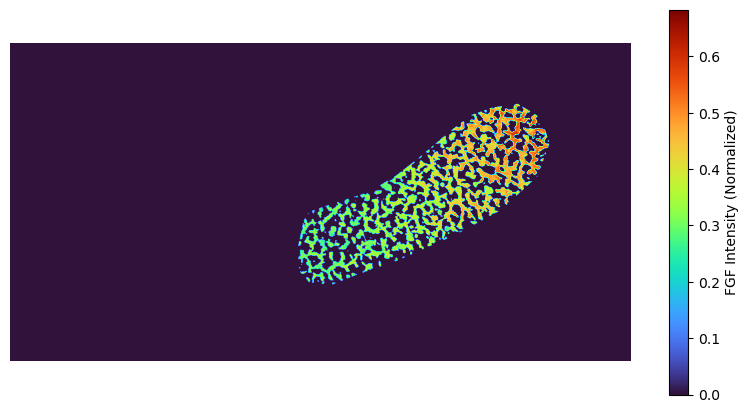

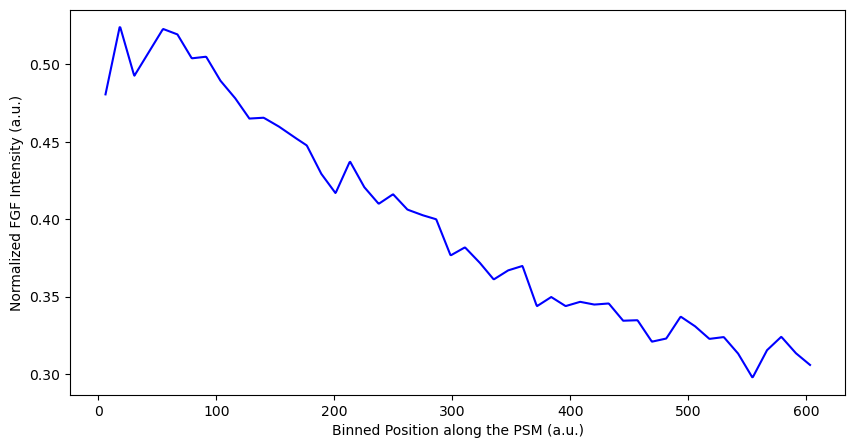

Processing image set 20/22


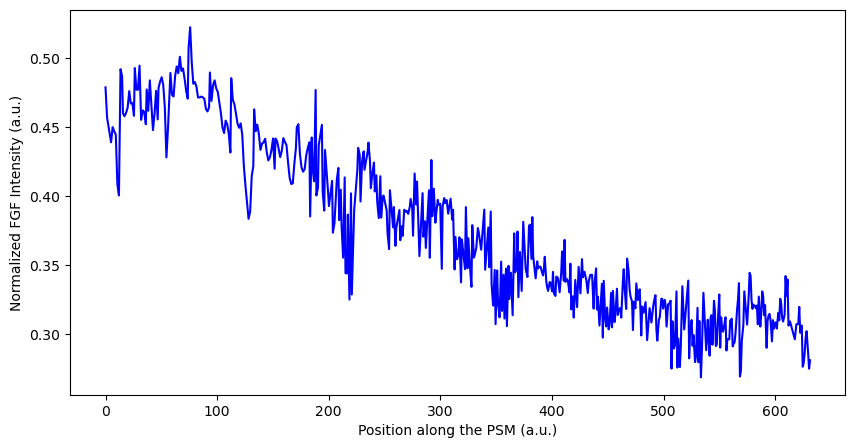

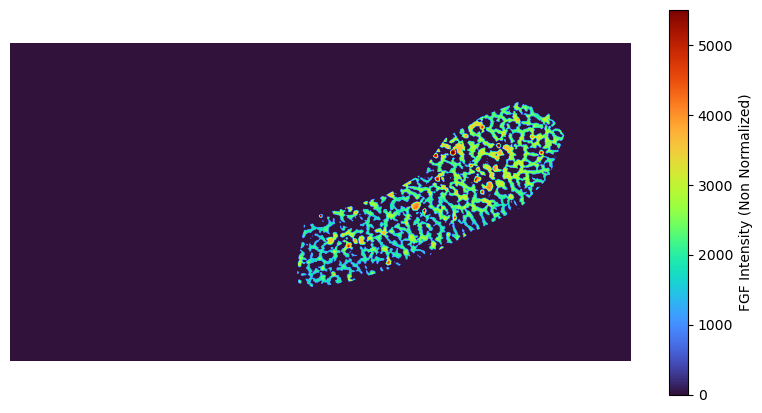

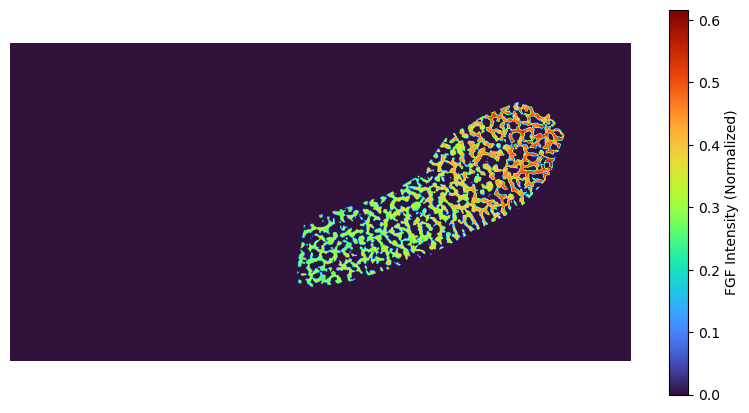

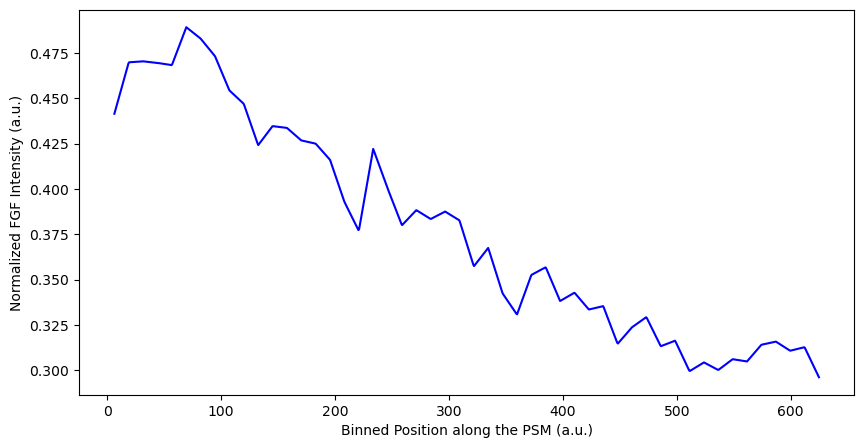

Processing image set 21/22


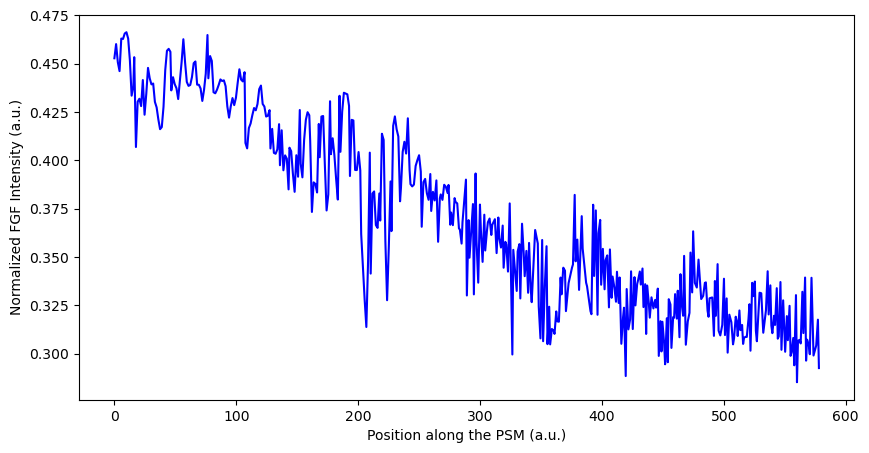

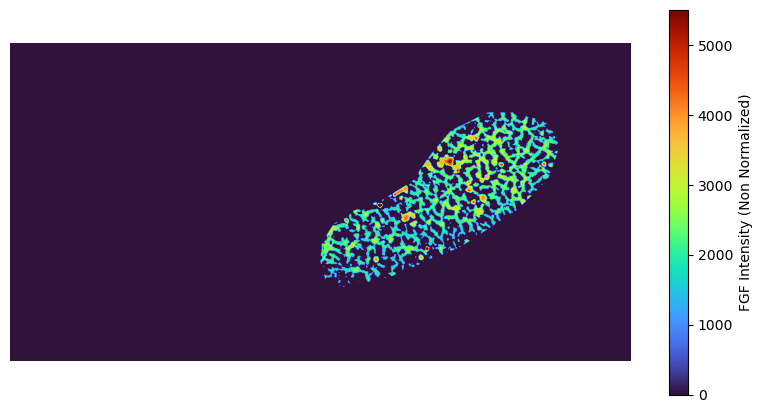

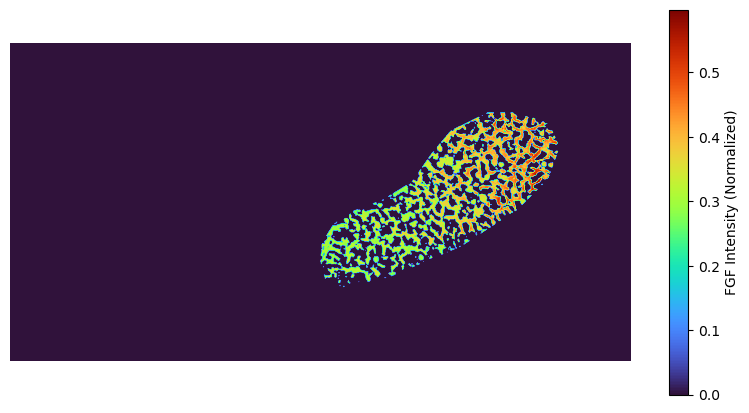

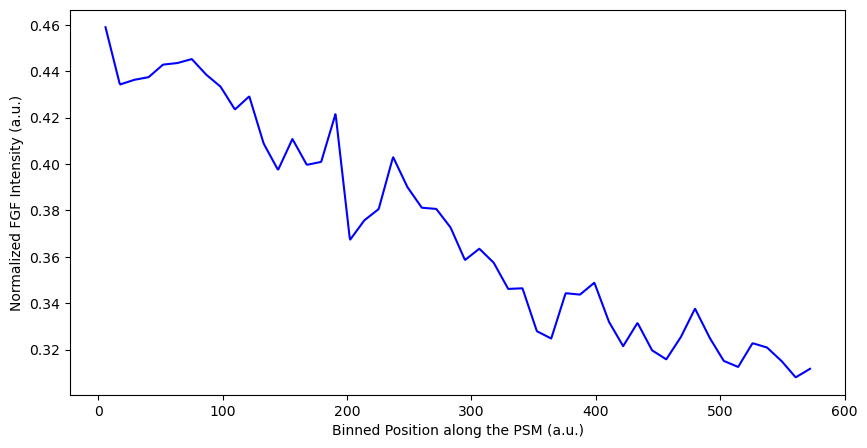

Processing image set 22/22


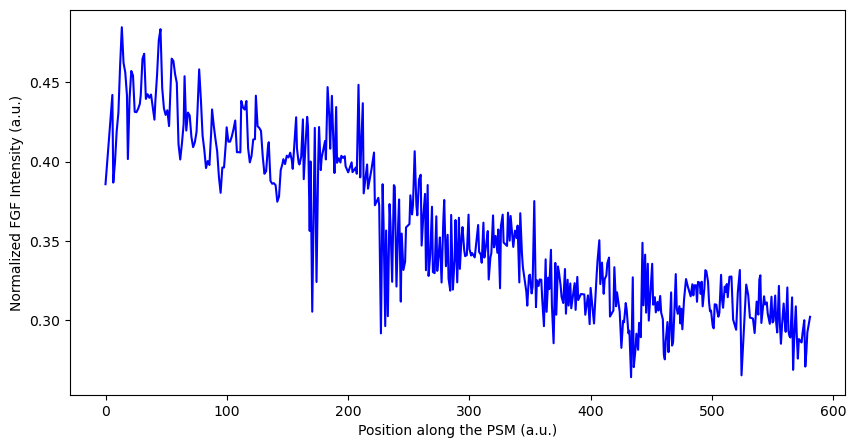

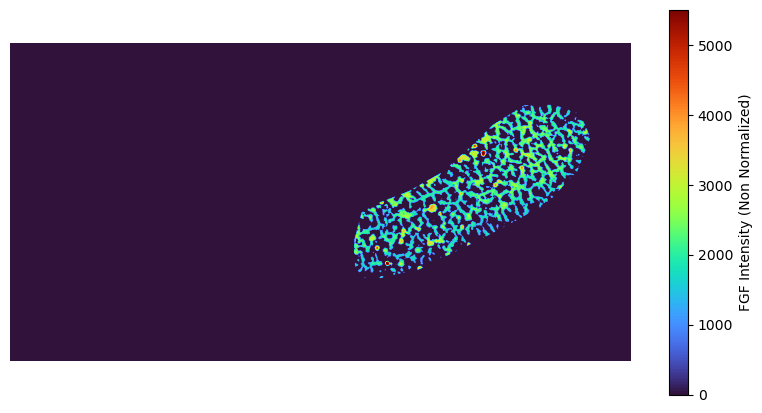

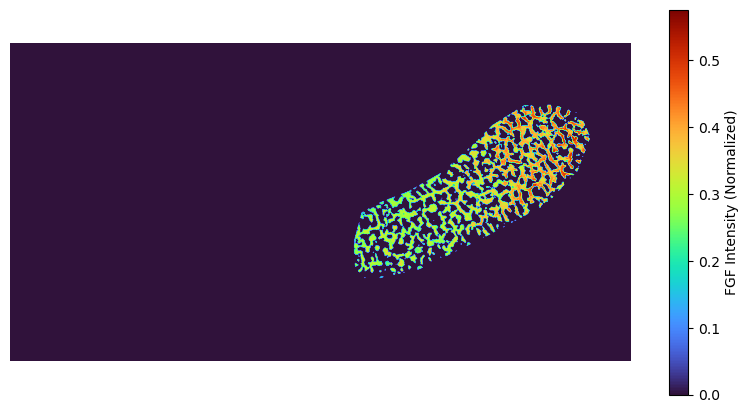

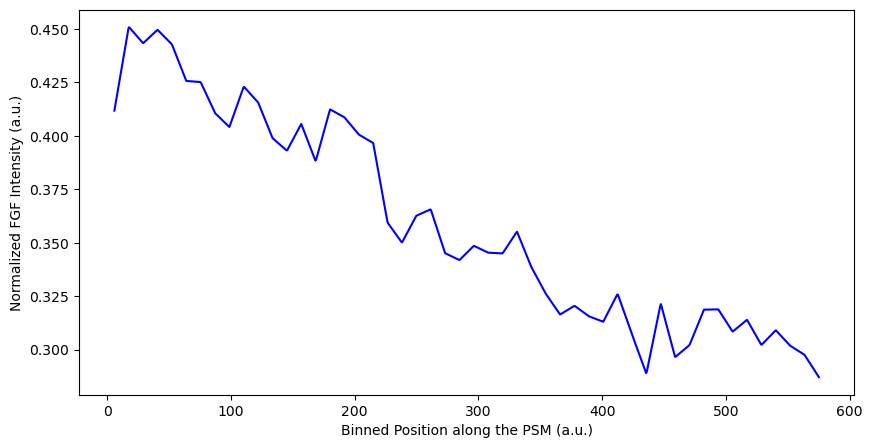

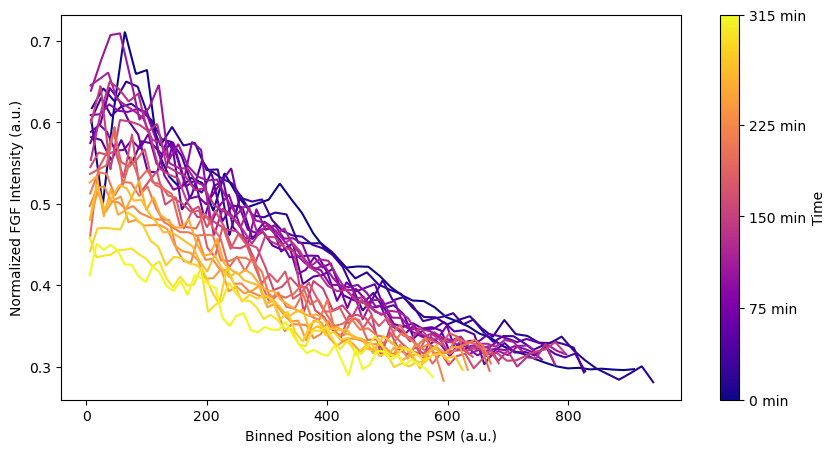

Processing complete. Results saved in H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/result


In [13]:
image_dir = 'H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/fgf/'
mask_dir = 'H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/fgf_mask/'
psm_dir = 'H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/tissue/'
loi_dir = 'H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/loi/'
dextran_dir = 'H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/dex/'
results_dir = 'H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/result'

fgf_quantification_pipeline_multiple(image_dir, mask_dir, psm_dir, loi_dir, dextran_dir, results_dir)

Processing image set 1/22


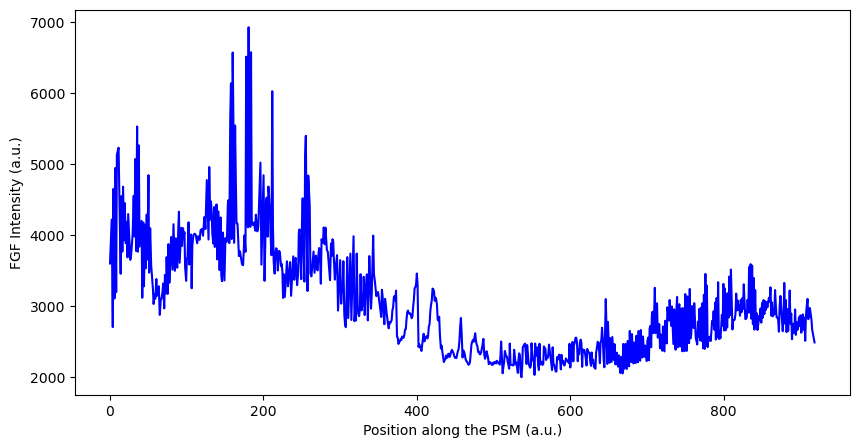

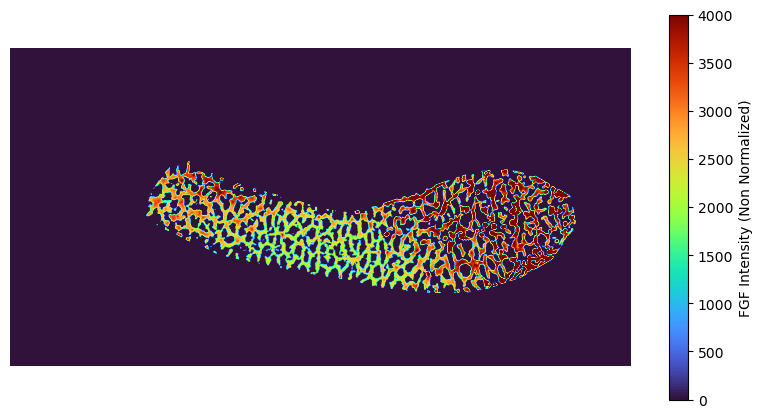

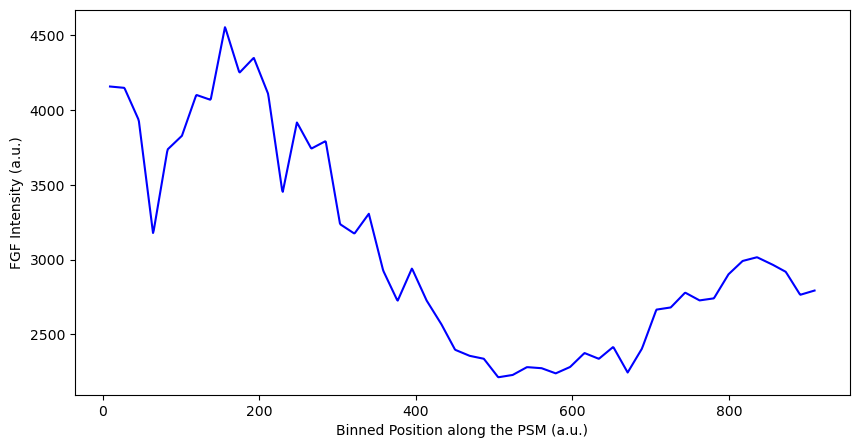

Processing image set 2/22


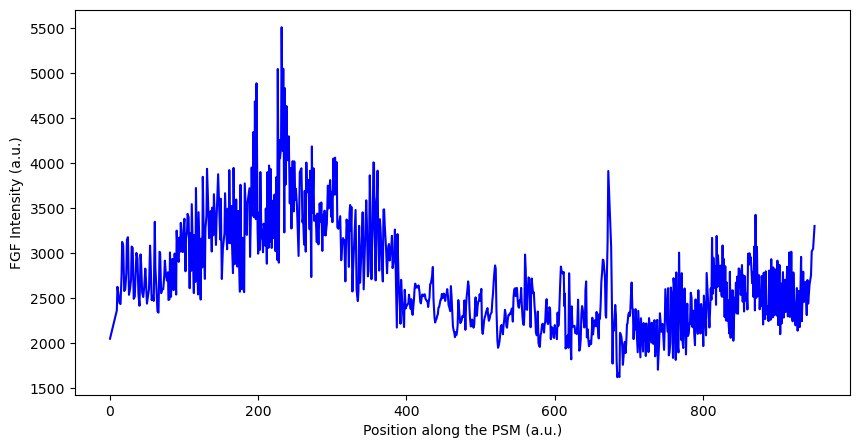

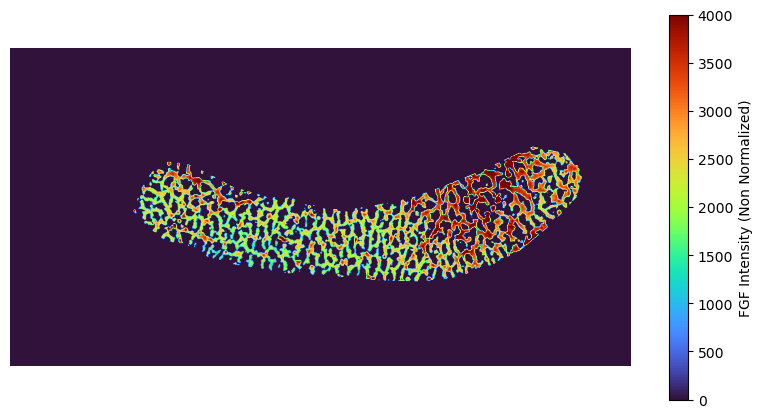

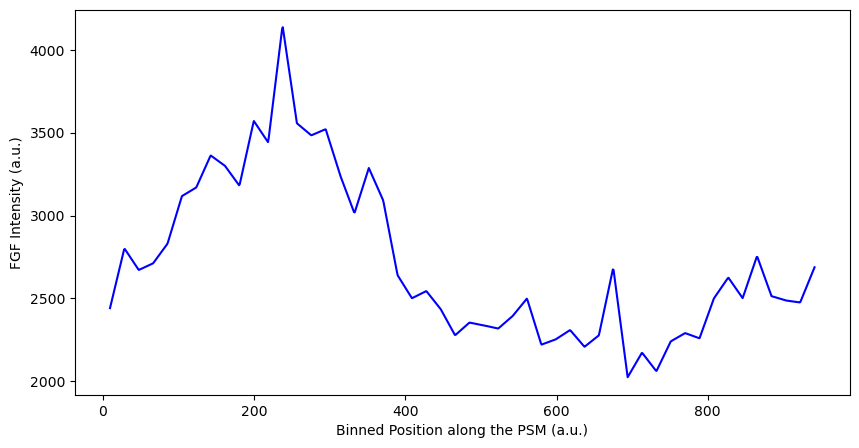

Processing image set 3/22


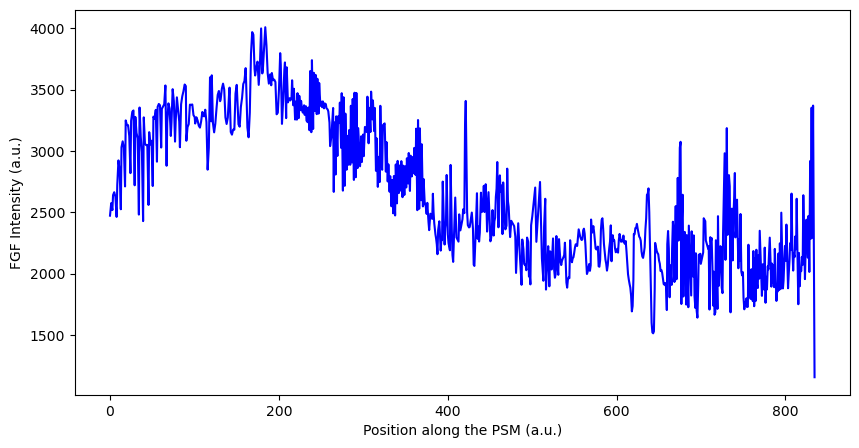

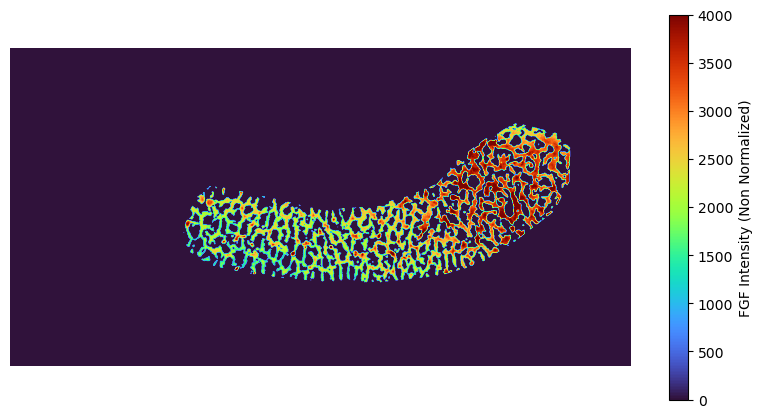

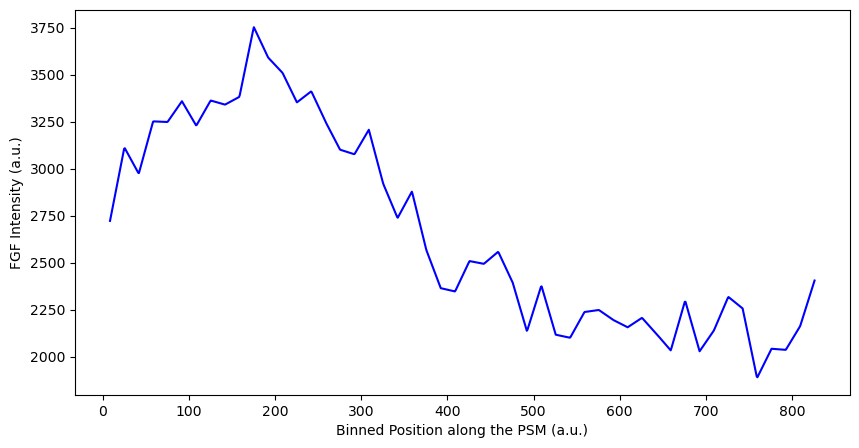

Processing image set 4/22


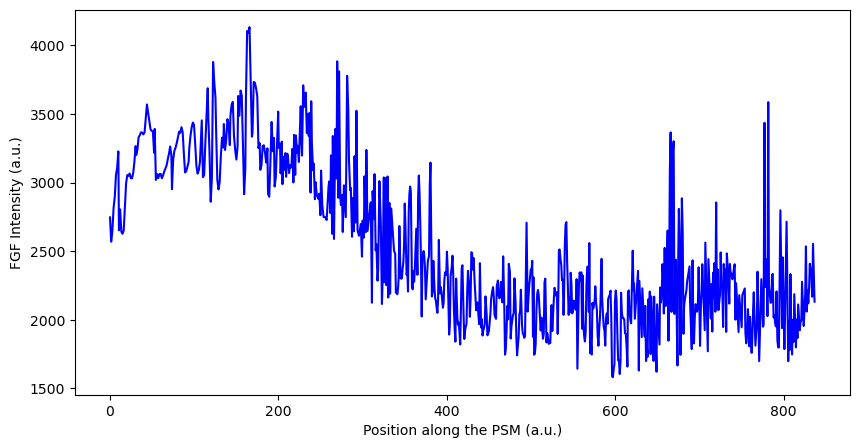

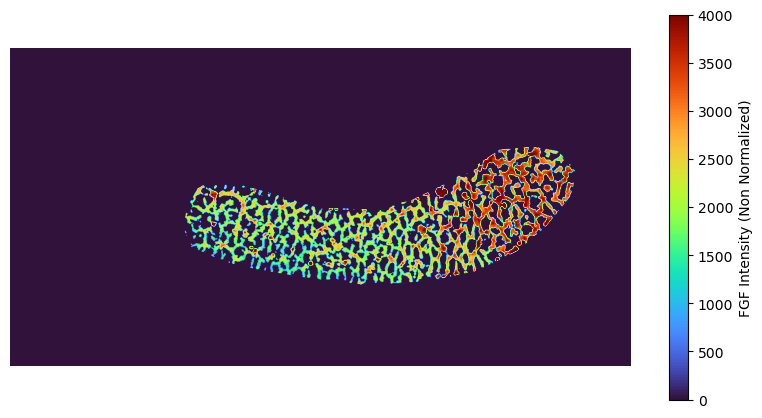

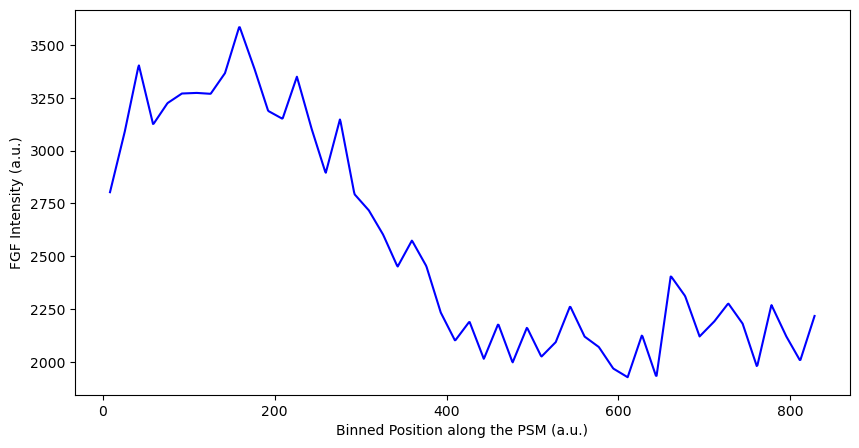

Processing image set 5/22


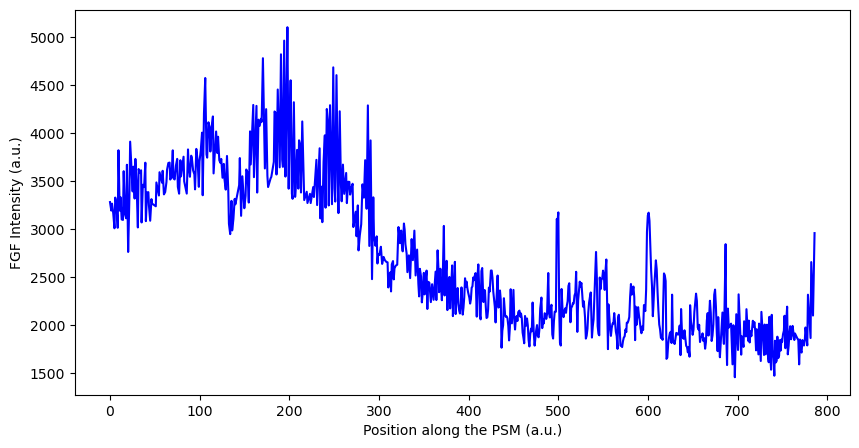

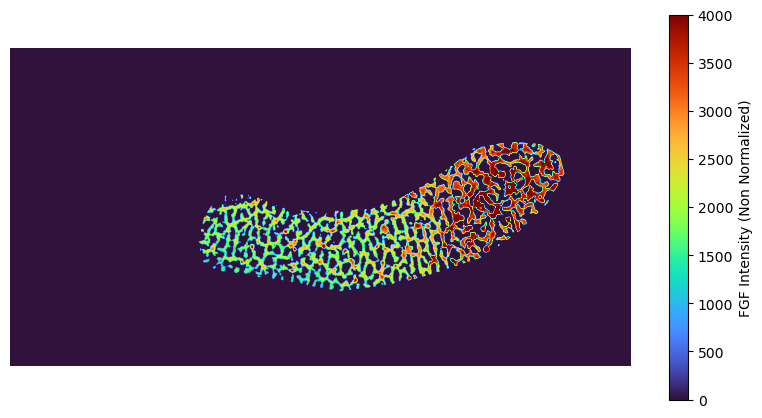

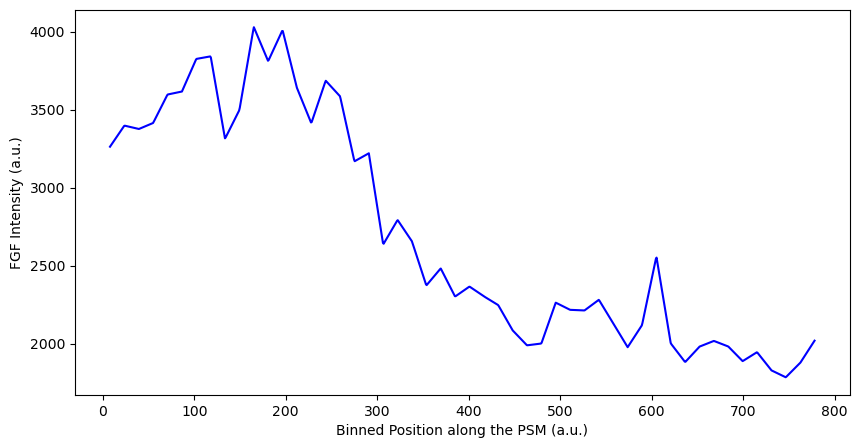

Processing image set 6/22


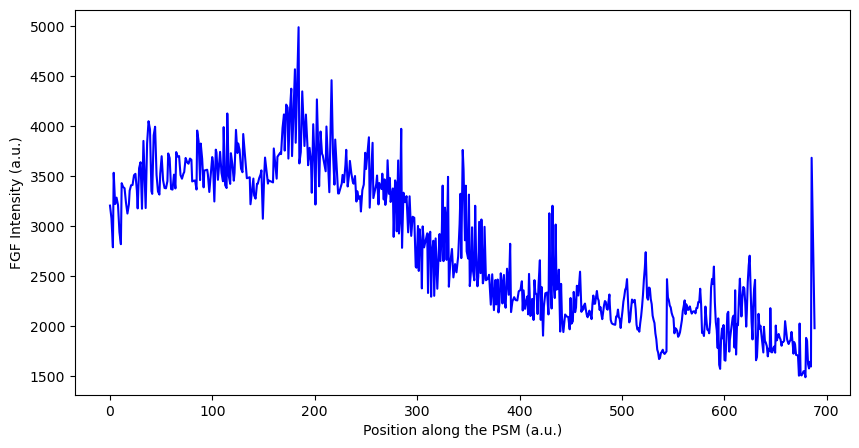

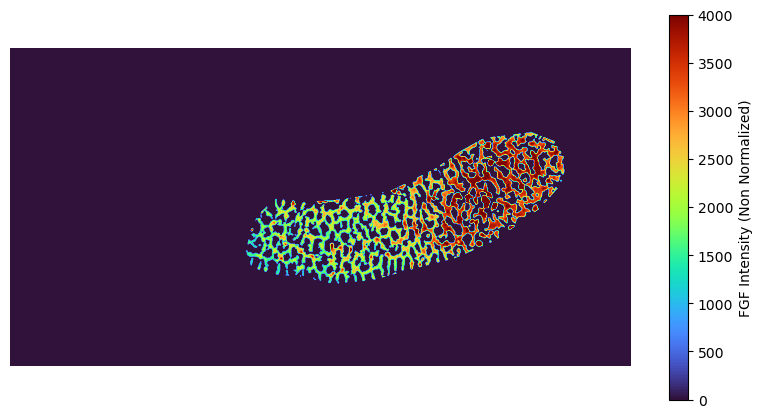

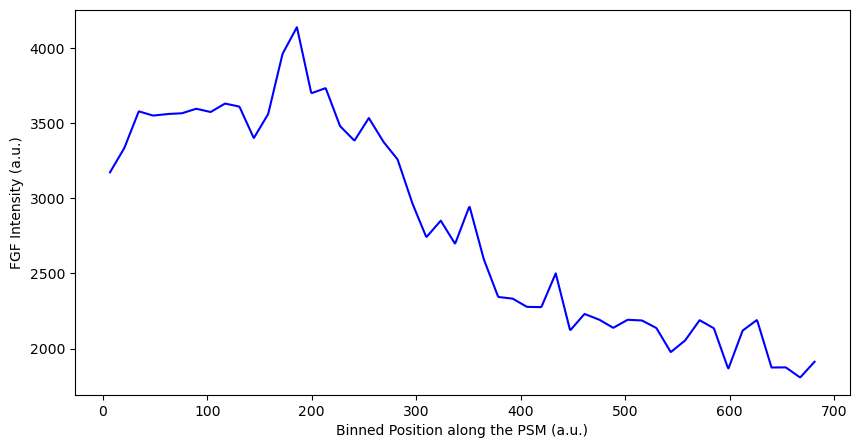

Processing image set 7/22


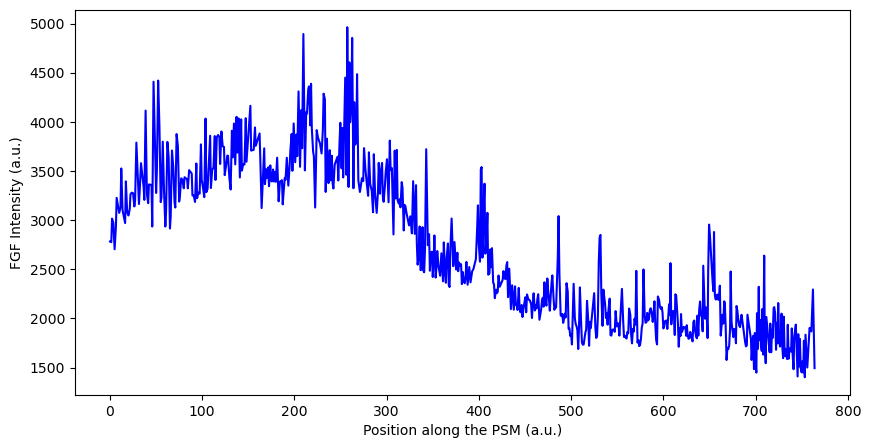

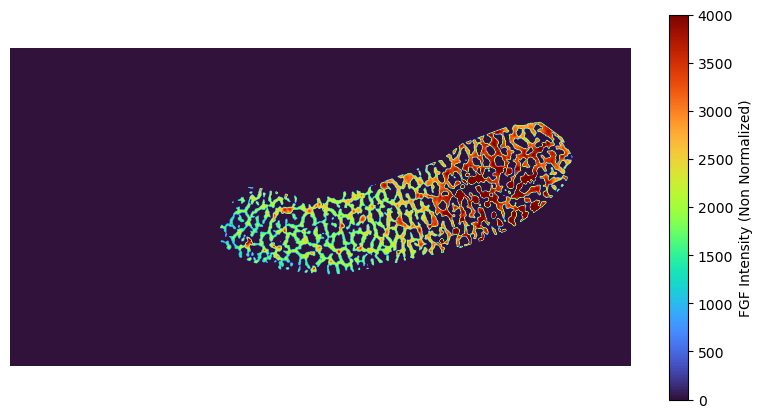

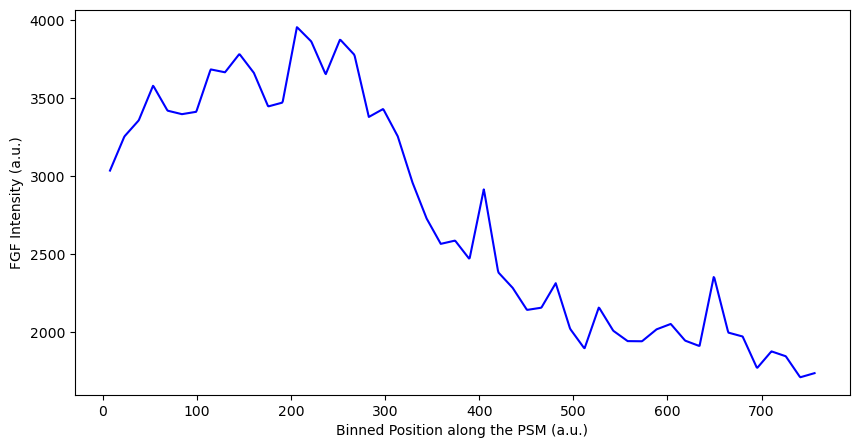

Processing image set 8/22


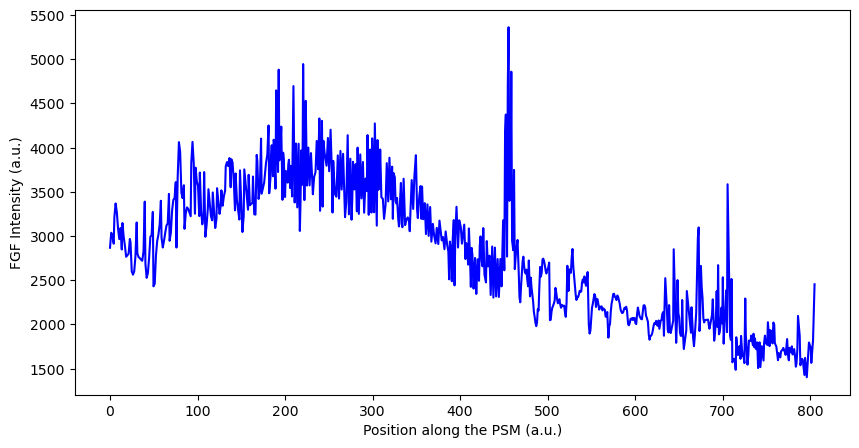

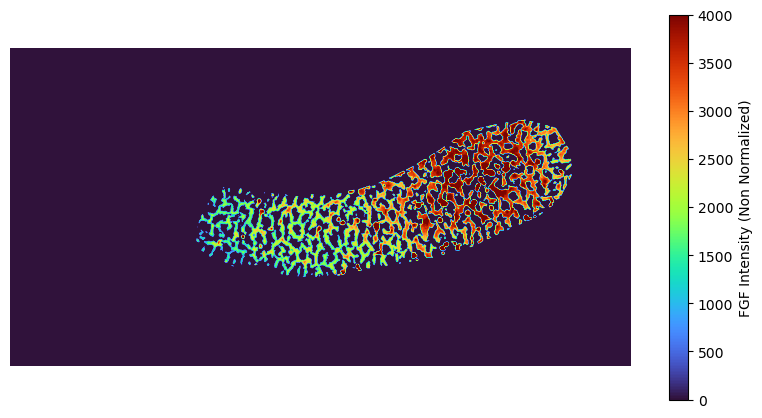

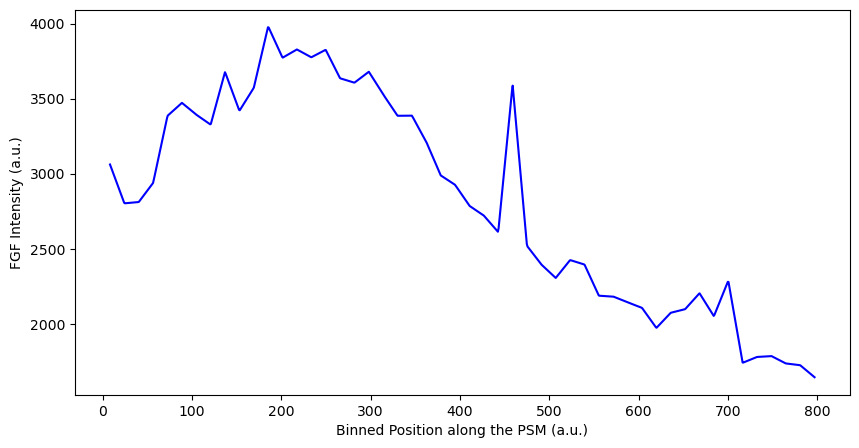

Processing image set 9/22


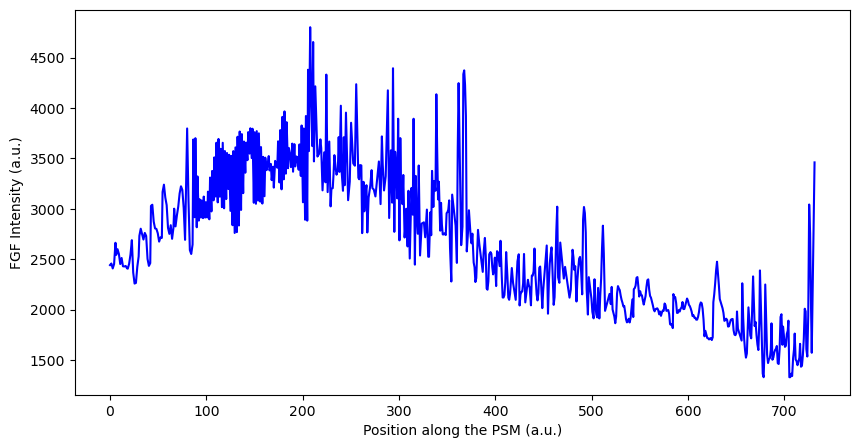

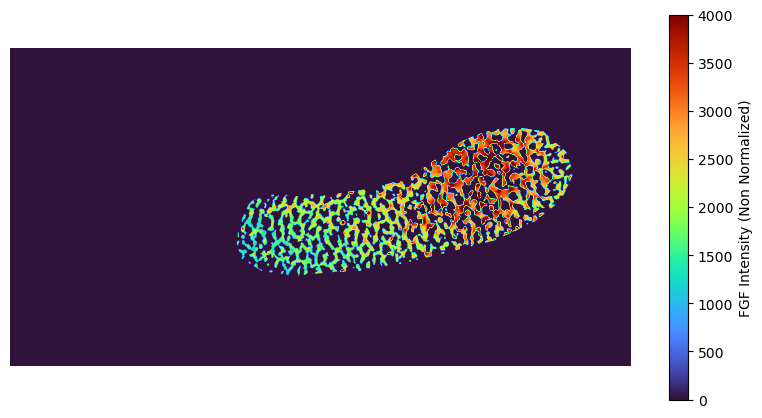

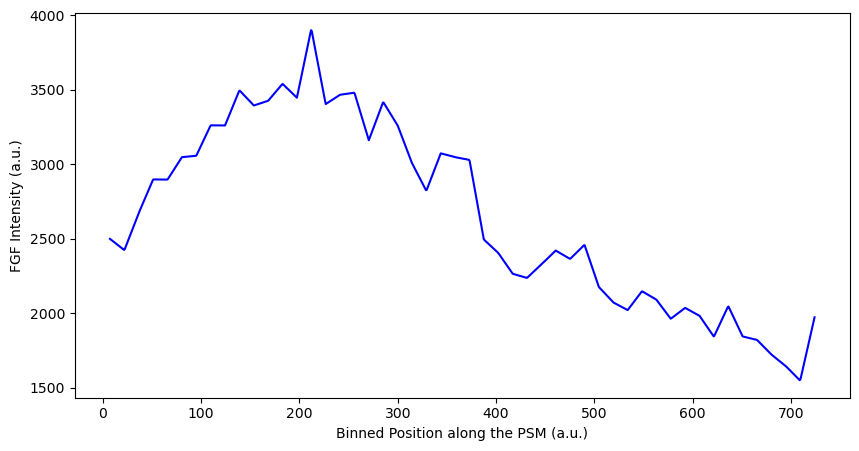

Processing image set 10/22


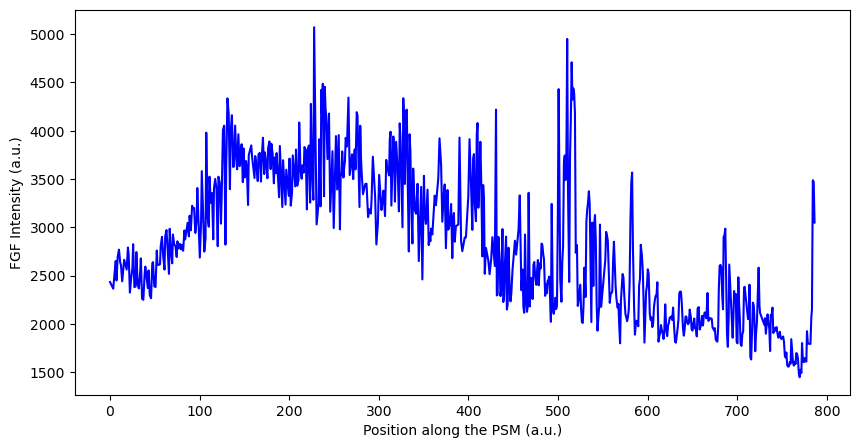

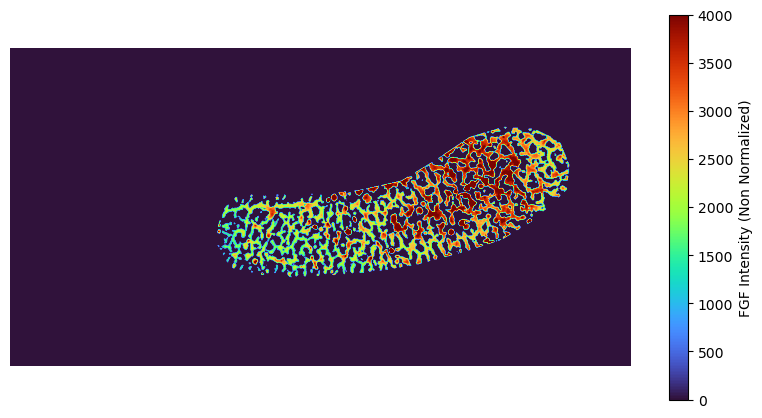

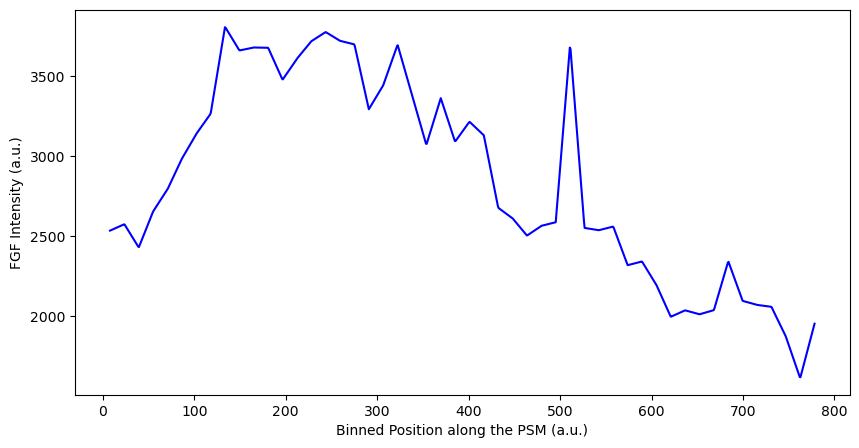

Processing image set 11/22


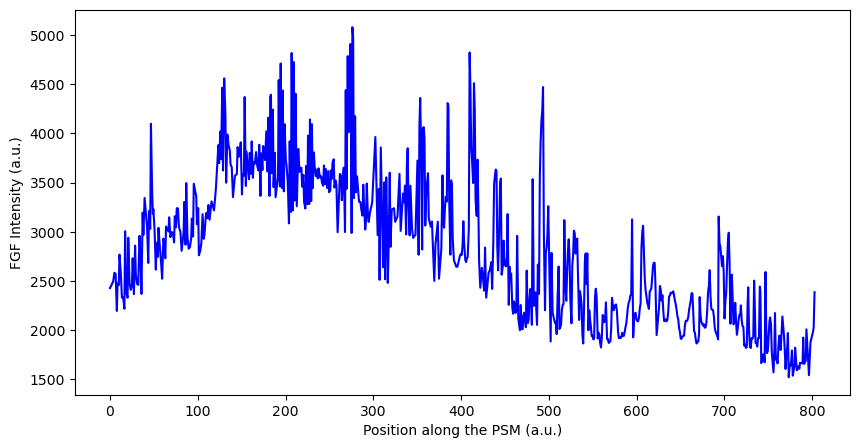

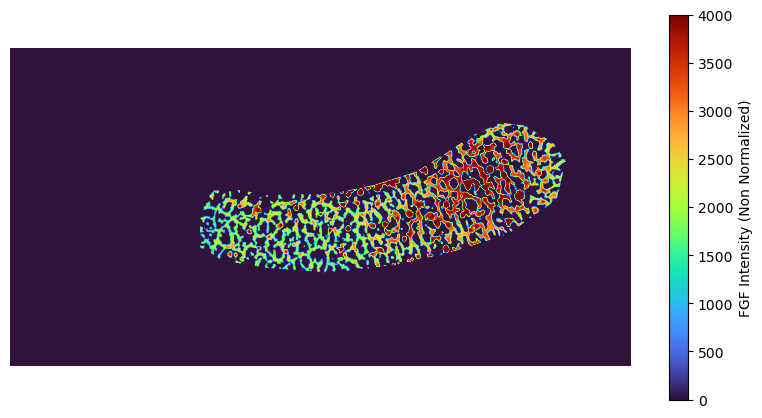

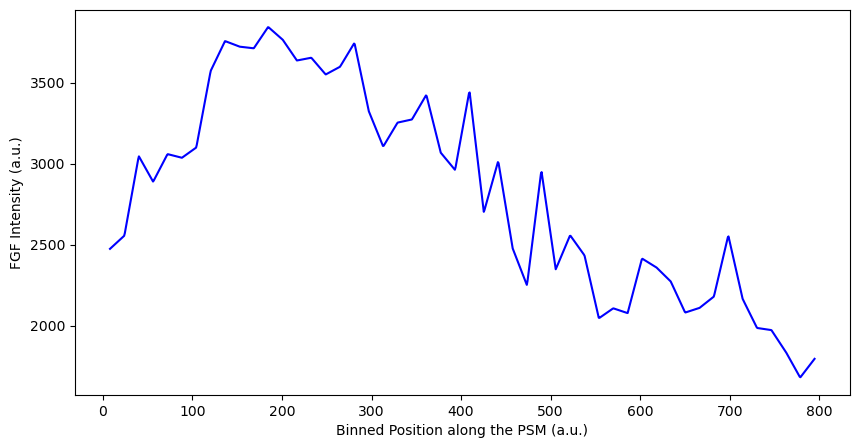

Processing image set 12/22


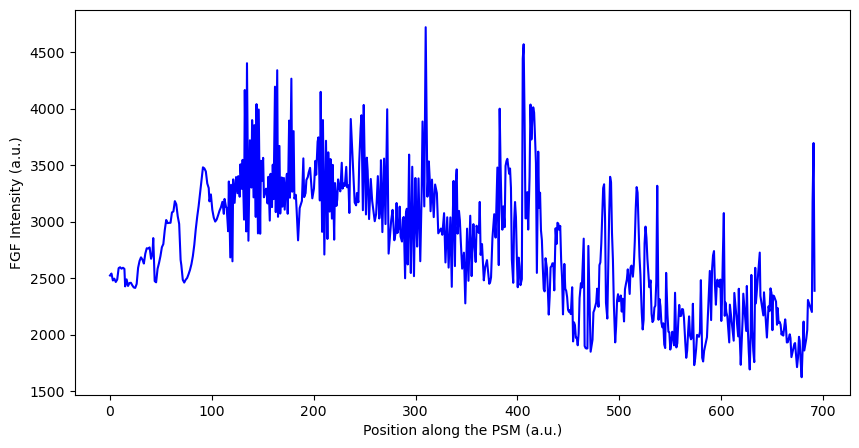

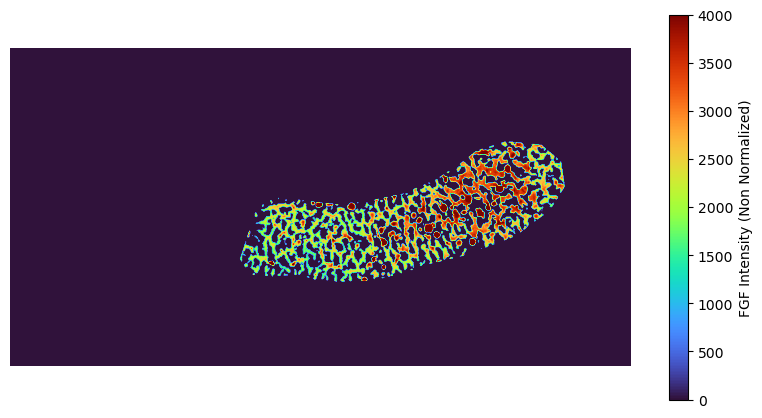

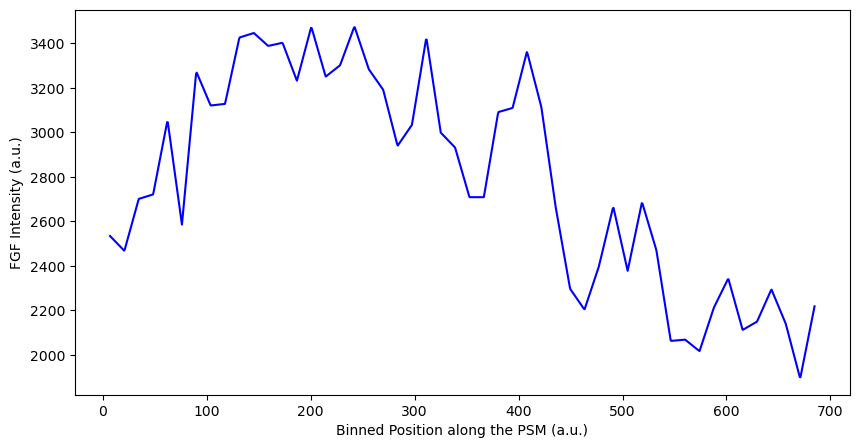

Processing image set 13/22


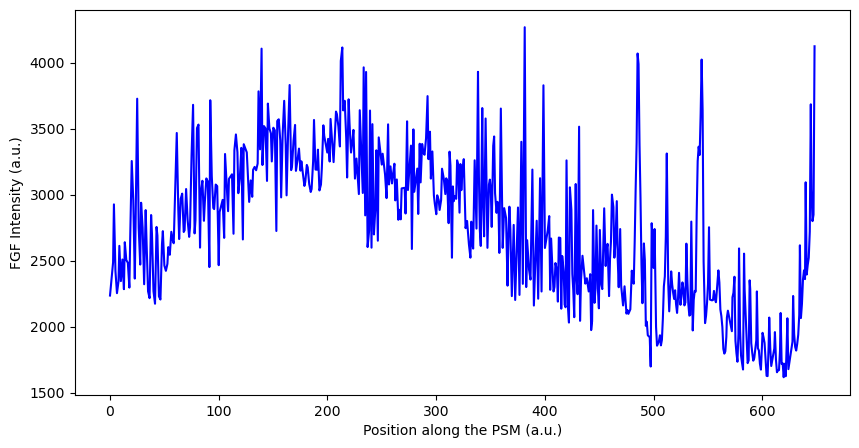

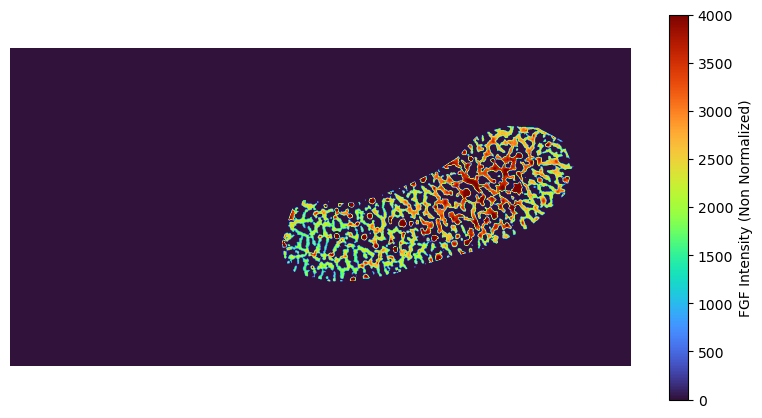

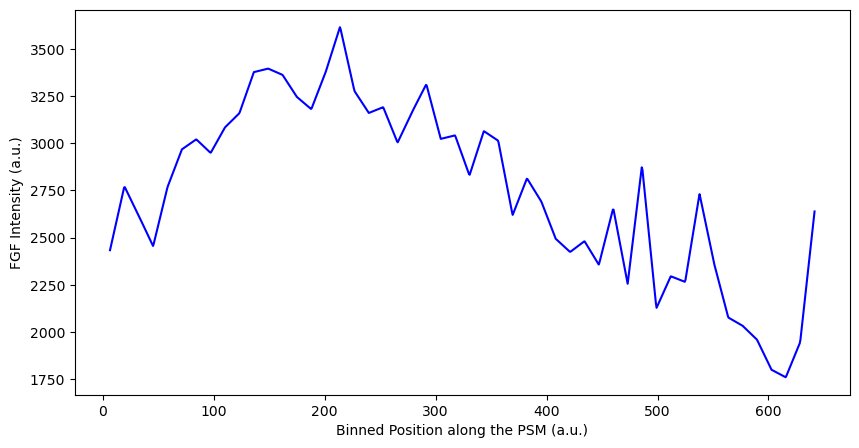

Processing image set 14/22


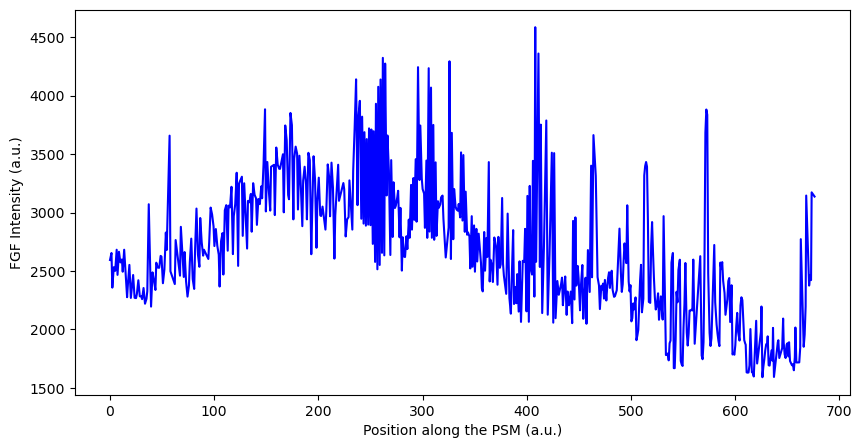

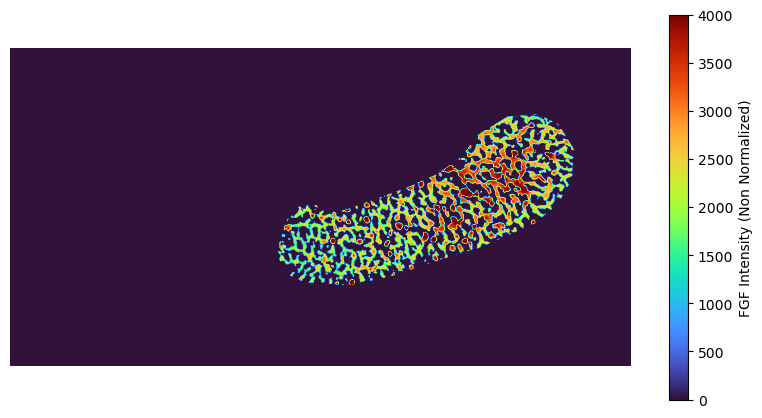

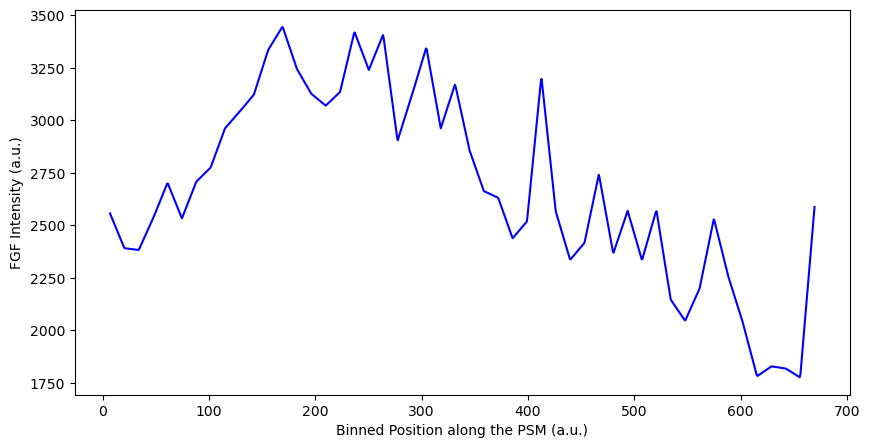

Processing image set 15/22


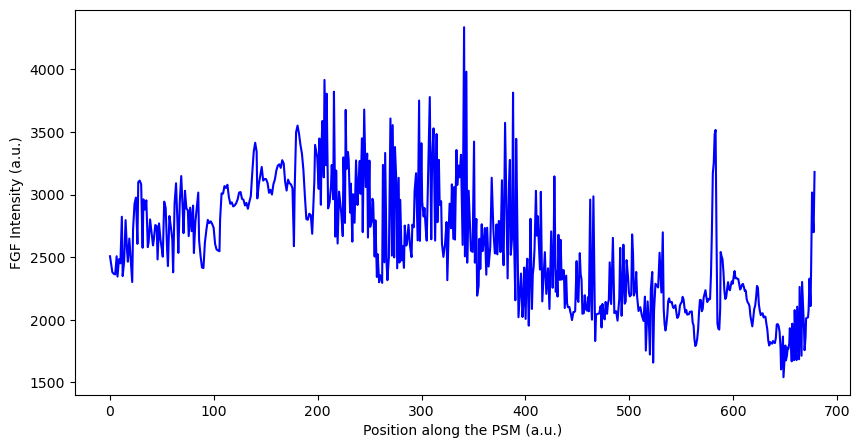

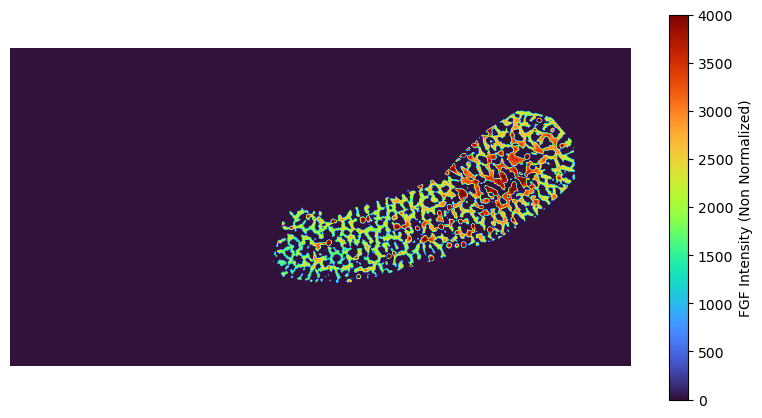

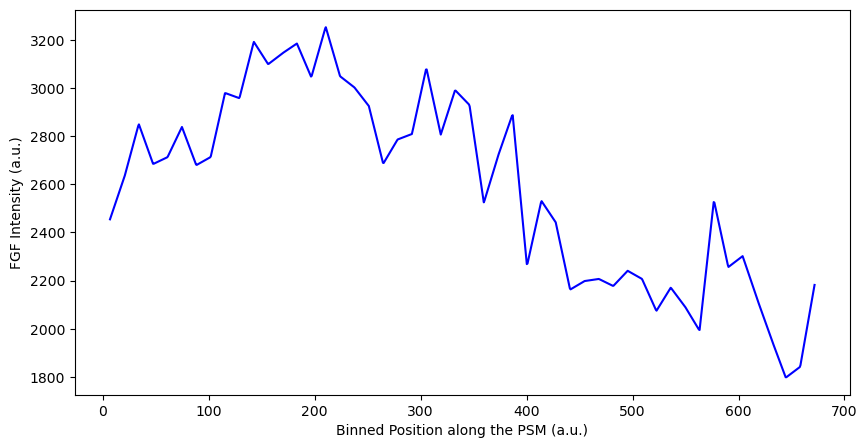

Processing image set 16/22


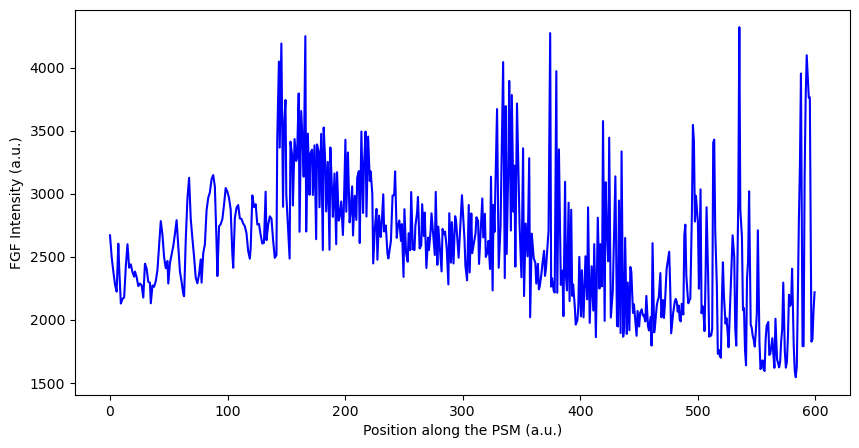

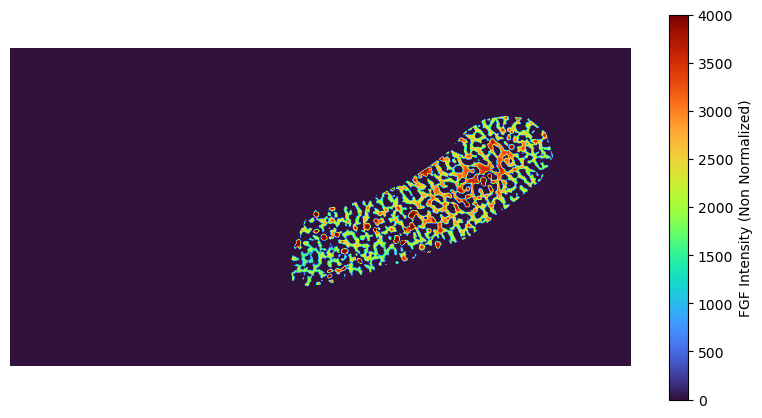

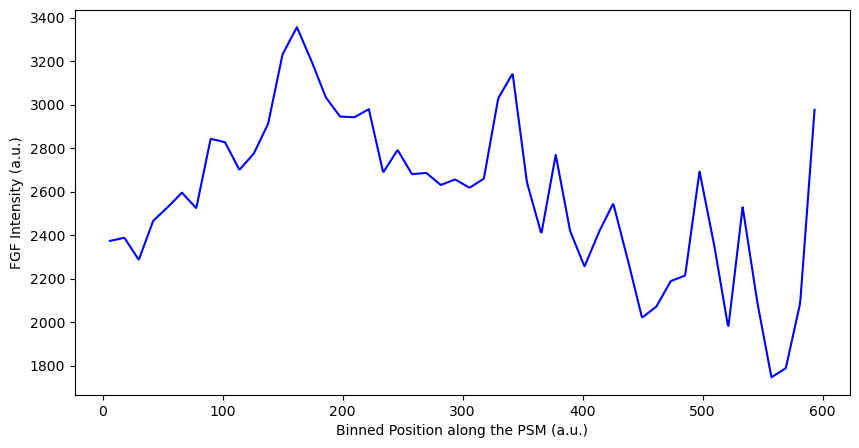

Processing image set 17/22


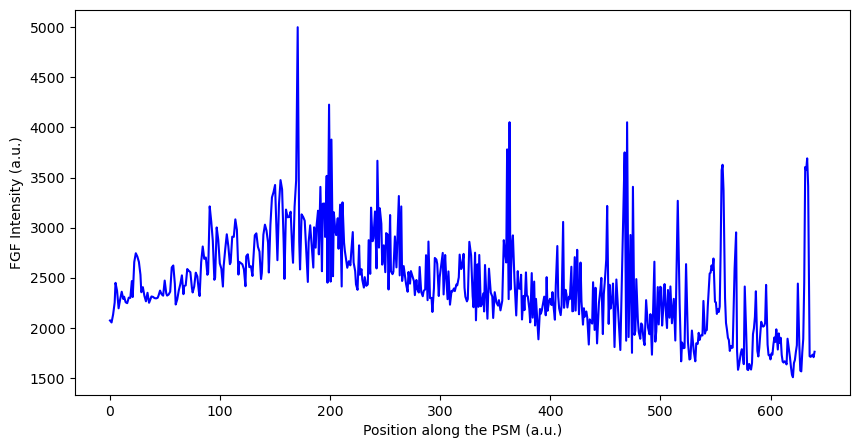

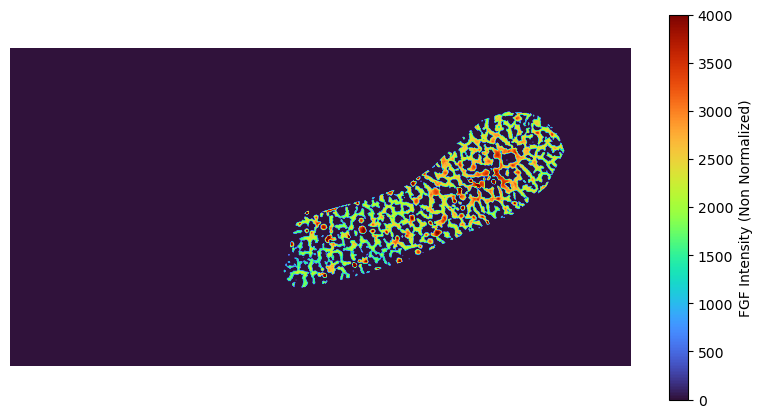

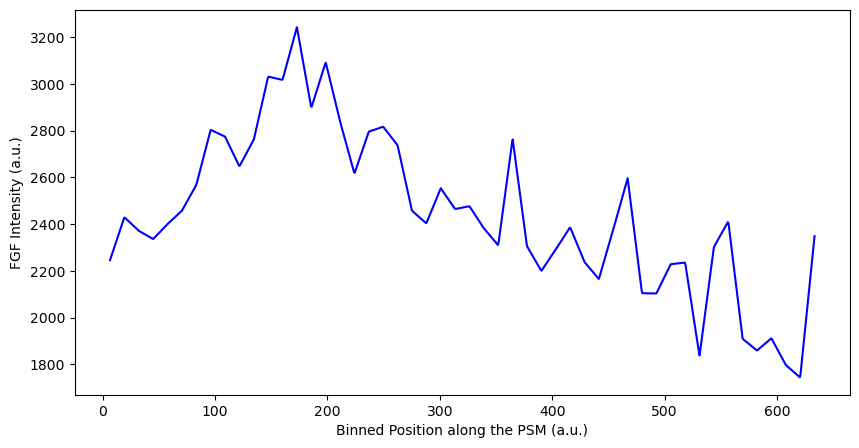

Processing image set 18/22


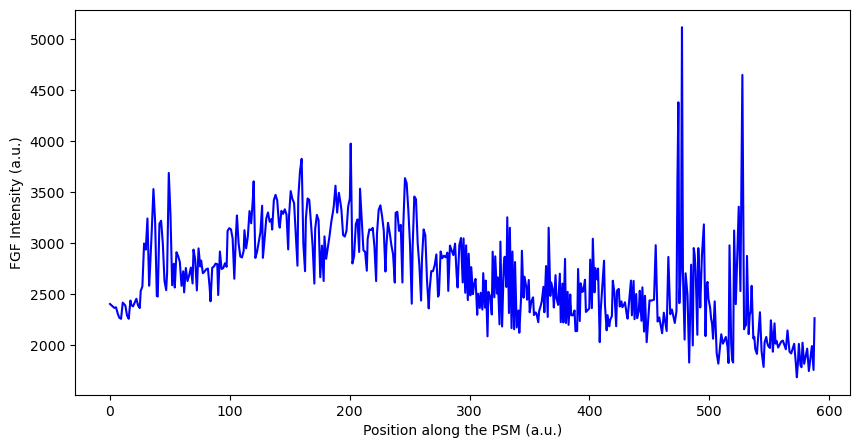

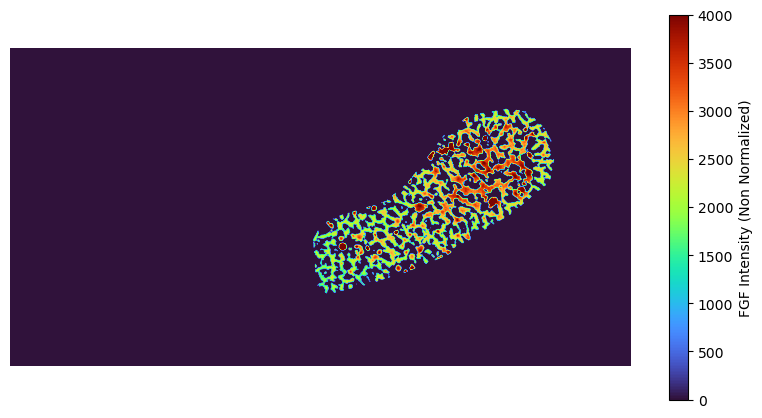

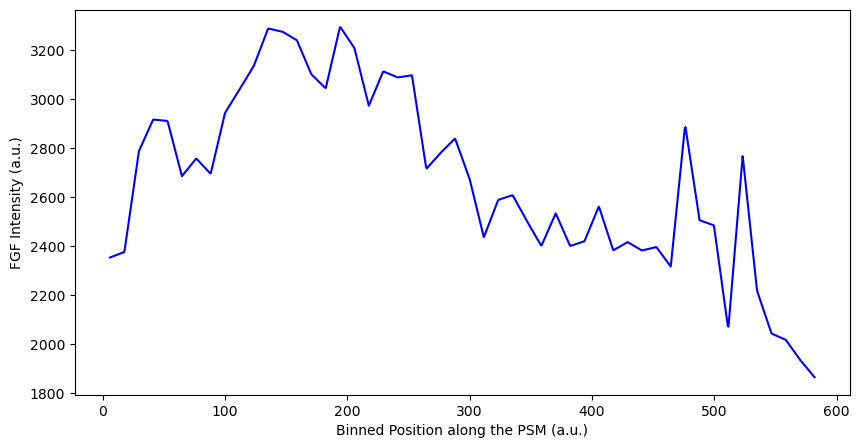

Processing image set 19/22


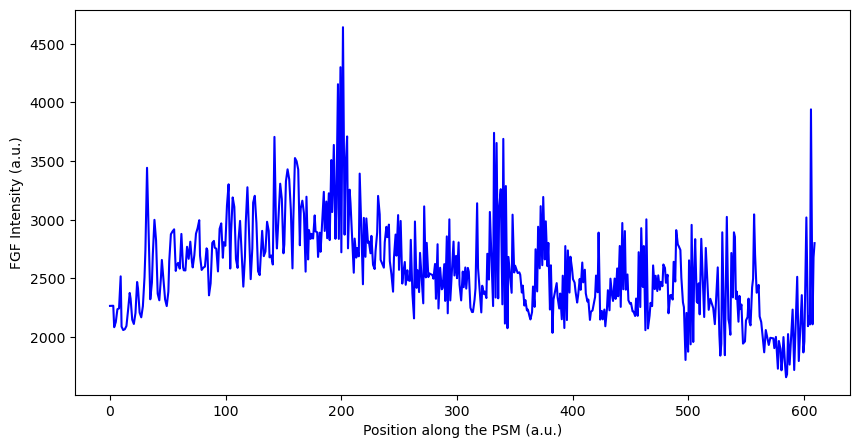

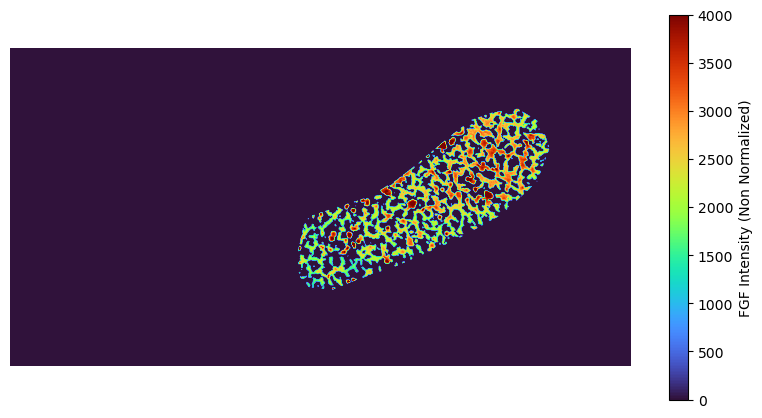

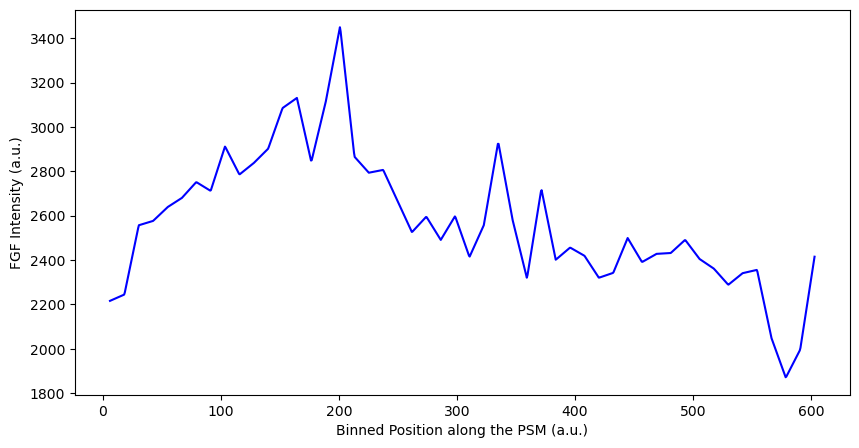

Processing image set 20/22


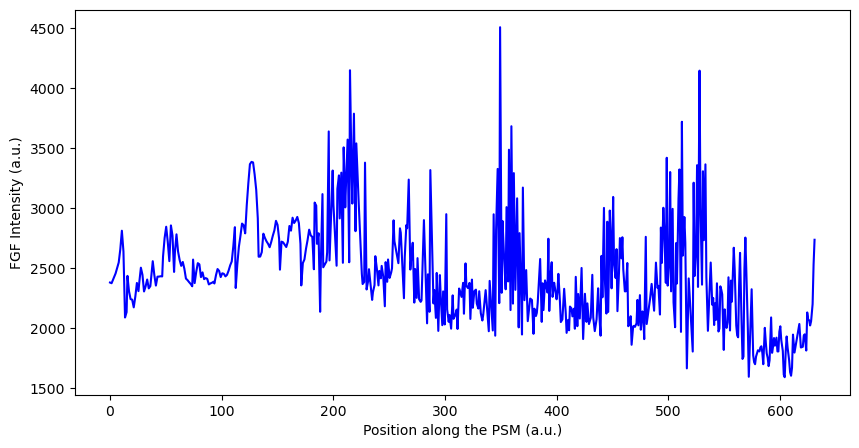

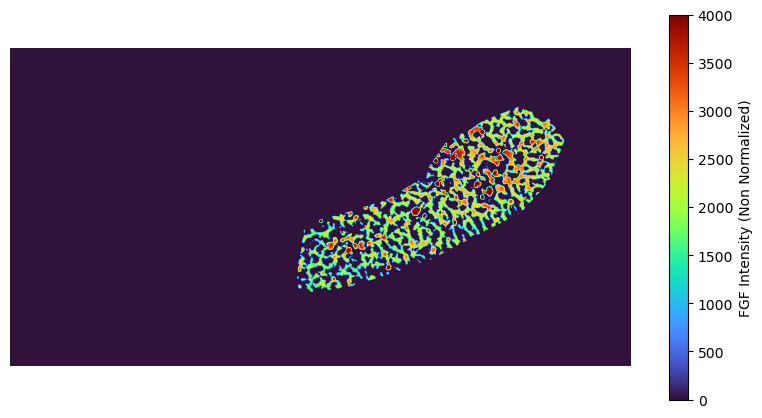

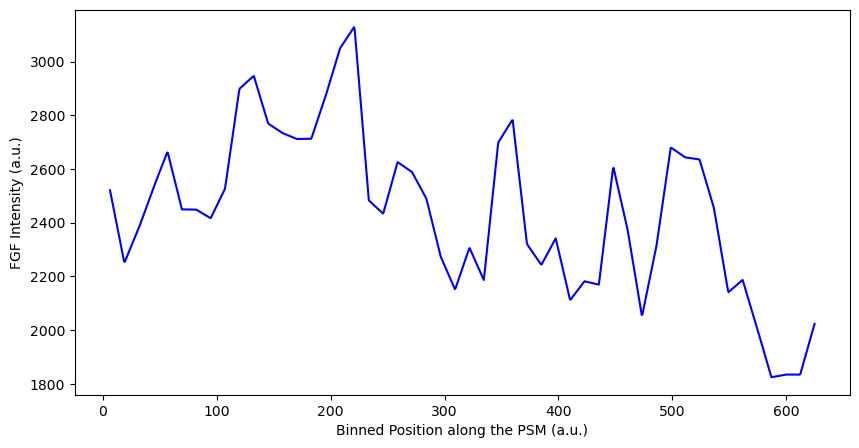

Processing image set 21/22


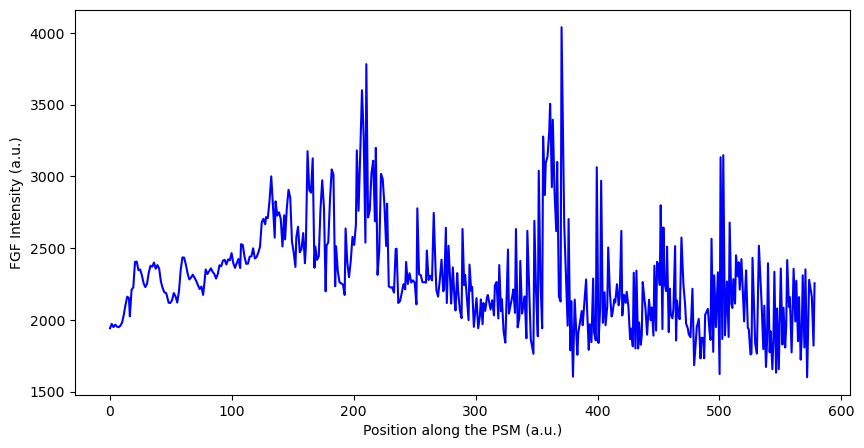

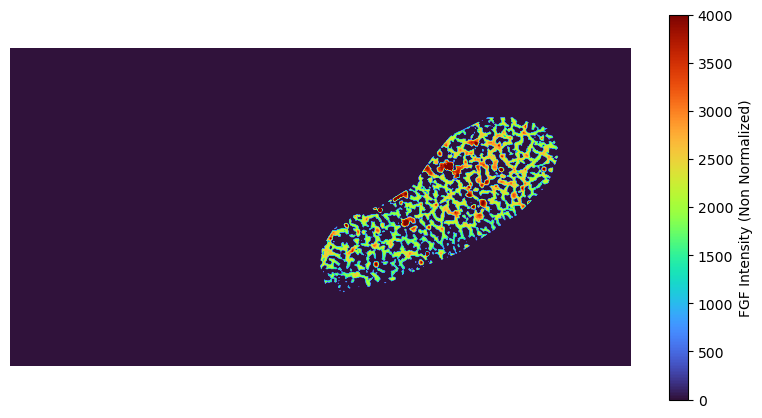

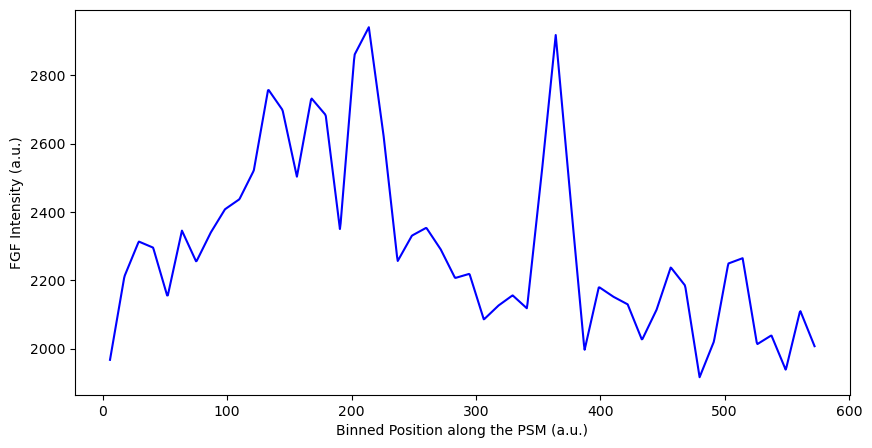

Processing image set 22/22


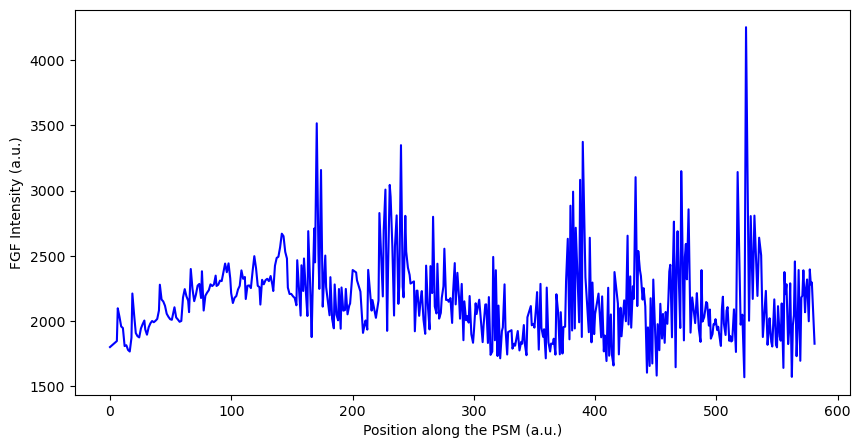

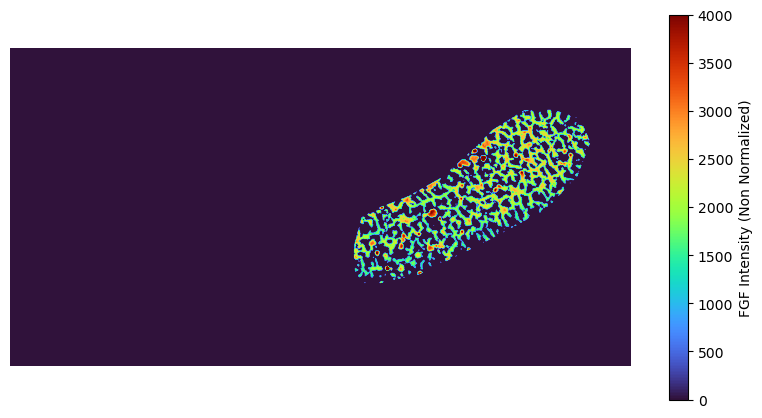

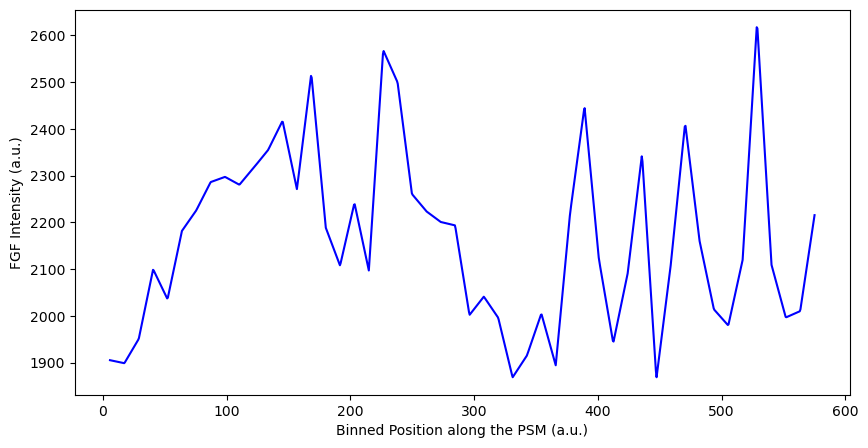

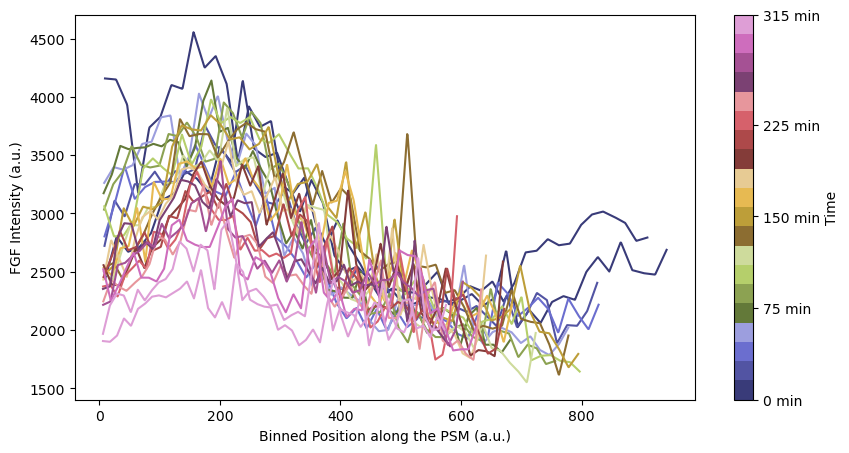

Processing complete. Results saved in H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/results/


In [6]:
#SINGLE CHANNEL QUANTIFICATION

def load_images(fgf_path, fgf_mask_path, psm_mask_path, loi_path, dextran_path):
    fgf = io.imread(fgf_path)
    fgf_mask = io.imread(fgf_mask_path)
    psm_mask = io.imread(psm_mask_path)
    loi = io.imread(loi_path)
    dextran = io.imread(dextran_path)
    return fgf, fgf_mask, psm_mask, loi, dextran

def create_combined_mask(fgf_mask, psm_mask):
    return fgf_mask * psm_mask

def find_positive_pixels(fgf_psm_mask, fgf_image):
    positive_pixels = np.column_stack(np.where(fgf_psm_mask))
    intensities = fgf_image[positive_pixels[:, 0], positive_pixels[:, 1]]
    return positive_pixels, intensities

def calculate_nearest_loi_points(positive_pixels, loi_coords):
    nearest_loi_points = []
    for pixel in positive_pixels:
        distances = distance.cdist([pixel], loi_coords, metric='euclidean')
        nearest_loi_point = np.argmin(distances)
        nearest_loi_points.append(nearest_loi_point)
    return np.array(nearest_loi_points)

def calculate_intensity_profile(nearest_loi_points, intensities, loi_coords):
    intensity_profile = np.zeros(len(loi_coords))
    counts = np.zeros(len(loi_coords))
    for i, loi_point_index in enumerate(nearest_loi_points):
        intensity_profile[loi_point_index] += intensities[i]
        counts[loi_point_index] += 1
    intensity_profile = np.divide(intensity_profile, counts, out=np.zeros_like(intensity_profile), where=counts > 0)
    return intensity_profile

def plot_intensity_profile(positions, interpolated_intensities, save_path):
    plt.figure(figsize=(10, 5))
    plt.plot(positions, interpolated_intensities, c='b')
    plt.xlabel('Position along the PSM (a.u.)')
    plt.ylabel('FGF Intensity (a.u.)')
    plt.savefig(save_path, format='svg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

def visualize_filtered_fgf(fgf_image, fgf_psm_binary, save_path):
    filtered_fgf = np.zeros_like(fgf_image)
    filtered_fgf[fgf_psm_binary] = fgf_image[fgf_psm_binary]
    
    plt.figure(figsize=(10, 5))
    plt.imshow(filtered_fgf, cmap='turbo', vmin=0, vmax=4000)
    plt.colorbar(label='FGF Intensity (Non Normalized)')
    plt.axis('off')
    plt.savefig(save_path, format='svg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

def visualize_filtered_normalized_fgf(fgf_image, dextran_image, fgf_psm_binary, save_path):
    normalized_fgf = np.zeros_like(fgf_image, dtype=np.float64)
    non_zero_dextran = dextran_image[fgf_psm_binary] > 0
    normalized_fgf[fgf_psm_binary] = fgf_image[fgf_psm_binary].astype(np.float64) / np.where(dextran_image[fgf_psm_binary] > 0, dextran_image[fgf_psm_binary], 1)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(normalized_fgf, cmap='turbo')
    plt.colorbar(label='FGF Intensity (Normalized)')
    plt.axis('off')
    plt.savefig(save_path, format='svg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

def plot_combined_binned_profiles(all_interp_positions, all_interp_values, save_path, num_timepoints):
    fig, ax = plt.subplots(figsize=(10, 5))

    cmap = plt.get_cmap('tab20b')  
    norm = plt.Normalize(vmin=0, vmax=num_timepoints - 1) 

    for i, (interp_positions, interp_values) in enumerate(zip(all_interp_positions, all_interp_values)):
        color = cmap(norm(i))  
        ax.plot(interp_positions, interp_values, color=color)  

    ax.set_xlabel('Binned Position along the PSM (a.u.)')
    ax.set_ylabel('FGF Intensity (a.u.)')

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', pad=0.05)  
    cbar.set_label('Time') 
    cbar_ticks = np.linspace(0, num_timepoints - 1, 5).astype(int)  
    cbar.set_ticks(cbar_ticks)
    cbar.set_ticklabels([f"{i * 15} min" for i in cbar_ticks])  
    plt.savefig(save_path, format='svg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

def load_multiple_images(image_dir, mask_dir, psm_dir, loi_dir, dextran_dir):
    fgf_images = sorted(glob.glob(os.path.join(image_dir, '*.tif')))
    fgf_masks = sorted(glob.glob(os.path.join(mask_dir, '*.tif')))
    psm_masks = sorted(glob.glob(os.path.join(psm_dir, '*.tif')))
    lois = sorted(glob.glob(os.path.join(loi_dir, '*.tif')))
    dextran_images = sorted(glob.glob(os.path.join(dextran_dir, '*.tif')))
    
    if not (len(fgf_images) == len(fgf_masks) == len(psm_masks) == len(lois) == len(dextran_images)):
        raise ValueError("Not the same number of images")
    
    return fgf_images, fgf_masks, psm_masks, lois, dextran_images

def fgf_quantification_pipeline_multiple(image_dir, mask_dir, psm_dir, loi_dir, dextran_dir, results_dir):
    fgf_images, fgf_masks, psm_masks, lois, dextran_images = load_multiple_images(image_dir, mask_dir, psm_dir, loi_dir, dextran_dir)
    
    all_interp_positions = []
    all_interp_values = []

    for i, (fgf_path, fgf_mask_path, psm_mask_path, loi_path, dextran_path) in enumerate(zip(fgf_images, fgf_masks, psm_masks, lois, dextran_images)):
        print(f"Processing image set {i + 1}/{len(fgf_images)}")
        
        image_results_dir = os.path.join(results_dir, f"image_set_{i + 1}")
        os.makedirs(image_results_dir, exist_ok=True)

        interp_positions, interp_values = fgf_quantification_pipeline_with_euclidean_no_normalization(fgf_path, fgf_mask_path, psm_mask_path, loi_path, dextran_path, image_results_dir)

        all_interp_positions.append(interp_positions)
        all_interp_values.append(interp_values)

    combined_plot_path = os.path.join(results_dir, 'combined_binned_profiles.svg')
    plot_combined_binned_profiles(all_interp_positions, all_interp_values, combined_plot_path, num_timepoints=len(fgf_images))
    
    print(f"Processing complete. Results saved in {results_dir}")

def fgf_quantification_pipeline_with_euclidean_no_normalization(fgf_path, fgf_mask_path, psm_mask_path, loi_path, dextran_path, results_dir):
    fgf, fgf_mask, psm_mask, loi, _ = load_images(fgf_path, fgf_mask_path, psm_mask_path, loi_path, dextran_path)
    fgf_psm_mask = create_combined_mask(fgf_mask, psm_mask)
    positive_pixels, fgf_intensities = find_positive_pixels(fgf_psm_mask, fgf)

    normalized_intensities = fgf_intensities.astype(np.float64)  # Nessuna normalizzazione

    loi_coords = np.column_stack(np.where(loi))
    nearest_loi_points = calculate_nearest_loi_points(positive_pixels, loi_coords)
    intensity_profile = calculate_intensity_profile(nearest_loi_points, normalized_intensities, loi_coords)

    rightmost_loi_point = loi_coords[np.argmax(loi_coords[:, 1])]
    distances_from_rightmost = distance.cdist([rightmost_loi_point], loi_coords, metric='euclidean').flatten()

    sorted_indices = np.argsort(distances_from_rightmost)
    sorted_distances = distances_from_rightmost[sorted_indices]
    sorted_intensity_profile = intensity_profile[sorted_indices]

    non_zero_mask = sorted_intensity_profile > 0
    interp_func = interp1d(sorted_distances[non_zero_mask], sorted_intensity_profile[non_zero_mask], bounds_error=False, fill_value="extrapolate")
    interpolated_intensities = interp_func(sorted_distances)

    plt.figure(figsize=(10, 5))
    plt.plot(sorted_distances, interpolated_intensities, c='b')
    plt.xlabel('Position along the PSM (a.u.)')
    plt.ylabel('FGF Intensity (a.u.)')
    plot_path = os.path.join(results_dir, 'intensity_profile_no_normalization.svg')
    plt.savefig(plot_path, format='svg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    filtered_fgf_image_path = os.path.join(results_dir, 'filtered_fgf_image_non_normalized.svg')
    fgf_psm_binary = fgf_psm_mask > 0
    visualize_filtered_fgf(fgf, fgf_psm_binary, filtered_fgf_image_path)

    num_bins = 50
    bin_edges = np.linspace(0, sorted_distances[-1], num_bins + 1)
    bin_indices = np.digitize(sorted_distances, bin_edges)

    binned_intensities = np.array([interpolated_intensities[bin_indices == i].mean() for i in range(1, num_bins + 1)])
    bin_centers = [(bin_edges[i] + bin_edges[i + 1]) / 2 for i in range(num_bins)]

    interp_bin_func = interp1d(bin_centers, binned_intensities, kind='linear', fill_value="extrapolate")
    interp_positions = np.linspace(bin_centers[0], bin_centers[-1], 1000)
    interp_values = interp_bin_func(interp_positions)

    plt.figure(figsize=(10, 5))
    plt.plot(interp_positions, interp_values, c='b')
    plt.xlabel('Binned Position along the PSM (a.u.)')
    plt.ylabel('FGF Intensity (a.u.)')
    binned_plot_path = os.path.join(results_dir, 'binned_plot_no_normalization.svg')
    plt.savefig(binned_plot_path, format='svg', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    return interp_positions, interp_values

image_dir = 'H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/fgf/'
mask_dir = 'H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/fgf_mask/'
psm_dir = 'H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/tissue/'
loi_dir = 'H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/loi/'
dextran_dir = 'H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/dex/'
results_dir = 'H:/PROJECTS-03/Agnese/20240822_FGFeGFP_dextran/pos2_quantification/results/'

fgf_quantification_pipeline_multiple(image_dir, mask_dir, psm_dir, loi_dir, dextran_dir, results_dir)